### Imports

In [1]:
# basic imports
import os, random
import pandas as pd
import numpy as np
import datetime as dt
import pandas_ta as ta
from pathlib import Path
import yfinance as yf
import math
from scipy import stats
from scipy.stats import shapiro

# import minisom
from minisom import MiniSom

# warnings
import warnings
warnings.filterwarnings('ignore')

# plotting & outputs
from pprint import pprint
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('seaborn')

# sklearn imports
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler, OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.model_selection import TimeSeriesSplit, cross_val_score
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.decomposition import PCA

# XGBoost
from xgboost import XGBClassifier

# metrics
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import confusion_matrix, auc, roc_curve, roc_curve

# import classifiers
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, StackingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.cluster import KMeans

# tensorflow
import tensorflow as tf
from tensorflow.keras.utils import plot_model
from tensorflow.keras.models import Sequential, Model, load_model
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator 
from tensorflow.keras.optimizers import Adam, RMSprop 
from tensorflow.keras.losses import BinaryCrossentropy 
from tensorflow.keras.metrics import BinaryAccuracy, Accuracy, AUC, Precision, Recall
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, TensorBoard
from tensorflow.keras.layers import Dropout, Dense, Flatten
from tensorflow.keras.layers import LSTM, BatchNormalization

# kerastuner
import keras_tuner as kt
from keras_tuner import HyperParameters
from keras_tuner.tuners import RandomSearch, BayesianOptimization, Hyperband

# set display option
pd.set_option('display.max_columns', 30)
pd.set_option('display.max_rows', 1000)

# Ignore warnings
import warnings
warnings.filterwarnings('ignore')

# # Machine info & package version
from watermark import watermark
%load_ext watermark
%watermark -a "Siqi He" -u -d -v -m -iv  

Author: Siqi He

Last updated: 2024-01-08

Python implementation: CPython
Python version       : 3.8.18
IPython version      : 8.12.2

Compiler    : Clang 16.0.6 
OS          : Darwin
Release     : 23.0.0
Machine     : arm64
Processor   : arm
CPU cores   : 8
Architecture: 64bit

numpy      : 1.22.4
matplotlib : 3.7.2
yfinance   : 0.2.33
scipy      : 1.7.3
tensorflow : 2.13.1
seaborn    : 0.13.0
pandas_ta  : 0.3.14b0
keras_tuner: 1.3.5
pandas     : 1.5.3



# Global variables

In [2]:
THRESH = 0.1               # Threshold for positive / negative returns

TICKER_NAME = "tesco"      # name of ticker in English
TICKER = "TSCO.L"          # main ticker ID
TICKER_PERIOD = '1d'       # main ticker period
FX_TICKER = "GBPUSD=X"     # currency ticker ID
FX_TICKER_PERIOD = '1d'    # currency ticker period
INDEX_TICKER = "^FTSE"     # index ticker ID
INDEX_TICKER_PERIOD = '1d' # index ticker period

CPI_DATA_PATH = "data/cpi_mom.csv"  # data file path for storing cpi data
FF_DATA_PATH = "data/europe_3_factors_daily.csv"  # data file path for storing Fama-French factors

START = '2014-01-01'       # study period start date
END = '2023-12-25'         # study period end date

RANDOM_SEED = 42           # random seed

### Load data

In [3]:
df = pd.read_csv("data/tesco_fx_index_data.csv")
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)
df

,Open,High,Low,Close,Adj Close,Volume,GBPUSD=X_Close,^FTSE_Close
Date,,,,,,,,
2014-01-02,425.029785,428.259796,415.783112,423.509796,272.076355,5710683,0.101138,NaN
2014-01-03,419.836395,421.656586,416.606506,418.633087,268.943451,10305400,-0.801011,0.190540
2014-01-06,420.533112,422.813110,418.189789,420.786407,270.326782,10974050,-0.211719,0.000000
2014-01-07,422.179810,424.269806,418.443115,420.216400,269.960571,13577058,0.029553,0.368458
2014-01-08,424.333099,428.069794,411.033112,415.846497,267.153259,27819606,-0.108246,-0.498856
...,...,...,...,...,...,...,...,...
2023-12-18,282.799988,284.899994,281.100006,283.500000,283.500000,12033304,-0.775551,0.502879
2023-12-19,284.200012,286.899994,281.399994,286.100006,286.100006,79752994,-0.161942,0.308622
2023-12-20,290.700012,292.000000,284.399994,288.600006,288.600006,16327513,0.639181,1.017285


In [4]:
df.describe()

,Open,High,Low,Close,Adj Close,Volume,GBPUSD=X_Close,^FTSE_Close
count,2521.000000,2521.000000,2521.000000,2521.000000,2521.000000,2.521000e+03,2518.000000,2519.000000
mean,269.845414,272.859408,266.822633,269.757187,202.529658,2.206785e+07,-0.010374,0.010055
std,43.062664,43.313593,42.756595,42.930694,38.633771,1.302543e+07,0.588262,0.997641
min,175.559906,177.206497,173.533203,176.319901,117.977043,0.000000e+00,-7.603841,-10.873819
25%,237.436493,240.300003,234.839905,237.246506,171.626022,1.438183e+07,-0.308993,-0.447667
50%,267.393188,270.209015,264.700012,267.076508,203.672791,1.902016e+07,-0.013406,0.054437
75%,292.346497,295.893188,288.419800,292.250000,231.344406,2.587214e+07,0.303727,0.498563
max,425.029785,432.662689,421.419800,425.283112,290.500000,1.955998e+08,3.077187,9.053047


In [5]:
# check missing values: missing values for the sterling dollar rate and FTSE100 price 
# is due to some descrepancy in data availability across different tickers in the market
df.isna().sum()

Open              0
High              0
Low               0
Close             0
Adj Close         0
Volume            0
GBPUSD=X_Close    3
^FTSE_Close       2
dtype: int64

### Adjusted Close

In [6]:
# to use adjusted close, adjust all other price columns accordingly
data = df.copy()
data["Open"] = data["Open"]*data["Adj Close"]/data["Close"]
data["High"] = data["High"]*data["Adj Close"]/data["Close"]
data["Low"] = data["Low"]*data["Adj Close"]/data["Close"]

# Drop the "Close" column
data.drop("Close", axis=1, inplace=True)

# Rename the "Adj Close" column to "Close"
data.rename(columns={"Adj Close": "Close"}, inplace=True)

# view data
data

,Open,High,Low,Close,Volume,GBPUSD=X_Close,^FTSE_Close
Date,,,,,,,
2014-01-02,273.052845,275.127908,267.112484,272.076355,5710683,0.101138,NaN
2014-01-03,269.716495,270.885844,267.641510,268.943451,10305400,-0.801011,0.190540
2014-01-06,270.164057,271.628802,268.658631,270.326782,10974050,-0.211719,0.000000
2014-01-07,271.221929,272.564610,268.821356,269.960571,13577058,0.029553,0.368458
2014-01-08,272.605328,275.005901,264.060985,267.153259,27819606,-0.108246,-0.498856
...,...,...,...,...,...,...,...
2023-12-18,282.799988,284.899994,281.100006,283.500000,12033304,-0.775551,0.502879
2023-12-19,284.200012,286.899994,281.399994,286.100006,79752994,-0.161942,0.308622
2023-12-20,290.700012,292.000000,284.399994,288.600006,16327513,0.639181,1.017285


In [7]:
data.describe()

,Open,High,Low,Close,Volume,GBPUSD=X_Close,^FTSE_Close
count,2521.000000,2521.000000,2521.000000,2521.000000,2.521000e+03,2518.000000,2519.000000
mean,202.590191,204.820777,200.355930,202.529658,2.206785e+07,-0.010374,0.010055
std,38.672878,38.803206,38.532439,38.633771,1.302543e+07,0.588262,0.997641
min,117.468525,118.570272,116.112442,117.977043,0.000000e+00,-7.603841,-10.873819
25%,171.849892,174.083941,169.761514,171.626022,1.438183e+07,-0.308993,-0.447667
50%,203.797378,205.698102,201.713486,203.672791,1.902016e+07,-0.013406,0.054437
75%,231.518229,233.882694,229.702768,231.344406,2.587214e+07,0.303727,0.498563
max,291.299988,296.390408,288.799988,290.500000,1.955998e+08,3.077187,9.053047


In [8]:
data.isna().sum()

Open              0
High              0
Low               0
Close             0
Volume            0
GBPUSD=X_Close    3
^FTSE_Close       2
dtype: int64

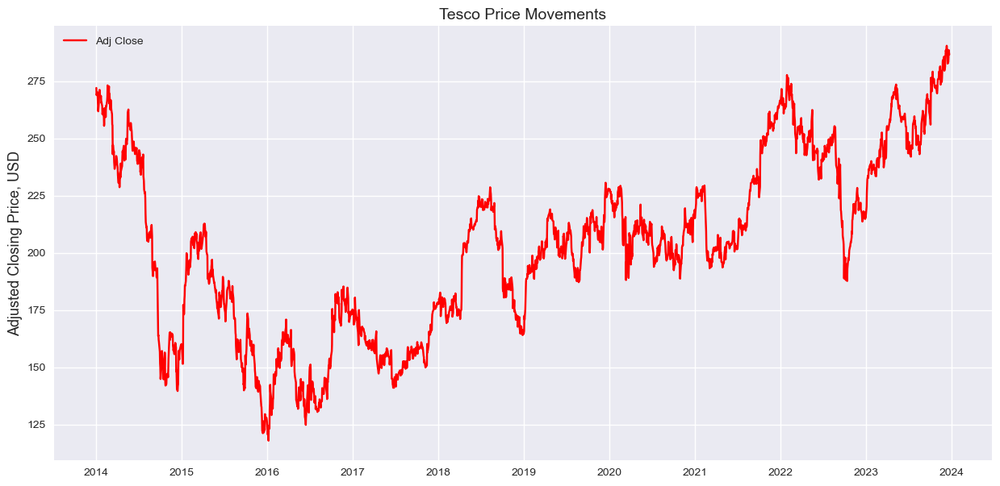

In [9]:
# plot the adjusted closing price over data period 
plt.style.use('seaborn')
fig, ax = plt.subplots(1,1, figsize = (15,7))
ax.plot(data.index, 
        data['Close'], 
        color='red', label="Adj Close")
plt.title('Tesco Price Movements', fontsize=14)
plt.ylabel('Adjusted Closing Price, USD', fontsize=13)
plt.legend(loc="upper left");

### Feature Engineering: Pandas TA strategies

In [10]:
# add all factors from pandas_ta library
data.ta.strategy('All')
data

0it [00:00, ?it/s]/Users/csqh/anaconda3/envs/pythonlab/lib/python3.8/multiprocessing/pool.py:48: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  return list(map(*args))
131it [00:01, 93.24it/s]


,Open,High,Low,Close,Volume,GBPUSD=X_Close,^FTSE_Close,ABER_ZG_5_15,ABER_SG_5_15,ABER_XG_5_15,ABER_ATR_5_15,ACCBL_20,ACCBM_20,ACCBU_20,AD,...,TTM_TRND_6,UI_14,UO_7_14_28,VAR_30,VHF_28,VIDYA_14,VTXP_14,VTXM_14,VWAP_D,VWMA_10,WCP,WILLR_14,WMA_10,ZL_EMA_10,ZS_30
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2014-01-02,273.052845,275.127908,267.112484,272.076355,5710683,0.101138,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.362453e+06,...,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,271.438916,NaN,271.598275,NaN,NaN,NaN,NaN
2014-01-03,269.716495,270.885844,267.641510,268.943451,10305400,-0.801011,0.190540,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-6.718979e+05,...,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,269.156935,NaN,269.103564,NaN,NaN,NaN,NaN
2014-01-06,270.164057,271.628802,268.658631,270.326782,10974050,-0.211719,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.808707e+05,...,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,270.204738,NaN,270.235249,NaN,NaN,NaN,NaN
2014-01-07,271.221929,272.564610,268.821356,269.960571,13577058,0.029553,0.368458,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-4.632151e+06,...,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,270.448846,NaN,270.326777,NaN,NaN,NaN,NaN
2014-01-08,272.605328,275.005901,264.060985,267.153259,27819606,-0.108246,-0.498856,269.997897,NaN,NaN,NaN,NaN,NaN,NaN,-1.673197e+07,...,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,268.740048,NaN,268.343351,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-18,282.799988,284.899994,281.100006,283.500000,12033304,-0.775551,0.502879,283.495066,292.215026,274.775107,8.719959,264.265514,284.489999,303.021267,-2.019593e+09,...,1,1.248830,71.113061,22.731146,0.292599,277.690313,0.979195,0.998459,283.166667,286.932261,283.250000,-16.315074,286.727274,285.184275,0.304828
2023-12-19,284.200012,286.899994,281.399994,286.100006,79752994,-0.161942,0.308622,282.401733,290.907029,273.896438,8.505295,264.478483,284.970000,303.709234,-1.963041e+09,...,1,1.312664,72.890309,22.337825,0.286196,277.752003,0.975202,0.966936,284.799998,286.804583,285.125000,-12.594082,286.558184,284.823500,0.793435
2023-12-20,290.700012,292.000000,284.399994,288.600006,16327513,0.639181,1.017285,282.141734,290.586677,273.696791,8.444943,264.654345,285.410001,304.597841,-1.961322e+09,...,1,1.324252,71.670451,22.884317,0.281924,277.878564,0.992736,0.941892,288.333333,286.925665,288.400002,-9.016213,286.807276,285.601047,1.232645


### Feature Engineering: CPI Month-on-Month change (Inflation indicator)
[Office for National Statistics]("https://www.ons.gov.uk/economy/inflationandpriceindices/datasets/consumerpriceinflation")

In [11]:
def add_cpi(data, cpi_mom_path):
    """
    Load MoM Consumer Price Index (CPI) data from a CSV file, join it to a provided time series DataFrame,
    and fill missing values using forward fill (ffill).

    Parameters:
    - data (pd.DataFrame): The input DataFrame to be enriched with CPI data.
    - cpi_mom_path (String): The file path storing the MoM CPI csv file.

    Returns:
    - pd.DataFrame: The input DataFrame with an additional column 'cpi_mom' representing
      the Consumer Price Index for the corresponding dates.

    Note:
    The function assumes the CSV file contains a 'Date' column in the format '%d/%m/%Y'
    and a single 'cpi_mom' column with numeric values storing MoM CPI change time-series data.
    """

    # Read csv file
    cpi_data = pd.read_csv(cpi_mom_path,dtype={'cpi_mom': 'float'})

    # Read datetime as timestamp
    cpi_data['Date'] = pd.to_datetime(cpi_data['Date'], format='%d/%m/%Y')

    # Set date column as index
    cpi_data.set_index('Date', inplace=True)

    # Get the first and last of the dates in the 'data' dataframe
    start=data.index[0].to_period('M').start_time.strftime('%Y-%m-%d')
    end=(data.index[-1] + dt.timedelta(days=1)).to_period('M').end_time.strftime('%Y-%m-%d')

    # Create an empty dataframe with index as daily timestamps for all dates in the 'data' dataframe date range
    date_range = pd.date_range(start=start, end=end, freq='D')
    empty_df = pd.DataFrame(index=date_range)

    # Fill the empty dataframe with forward-filled monthly CPI percentage change 
    # (e.g. all dates in month Jan-2020 is filled with the value of 01-Jan-2020)
    cpi_data_all_dates = empty_df.join(cpi_data, how="left").ffill(axis=0)

    # Merge the CPI dataset to "data" dataframe by index - keeping only the dates present in "data"
    data = data.join(cpi_data_all_dates, how="left") 

    return data

# Get CPI MOM change data and merge it to dataset.
data = add_cpi(data, CPI_DATA_PATH)

# view data 
data

,Open,High,Low,Close,Volume,GBPUSD=X_Close,^FTSE_Close,ABER_ZG_5_15,ABER_SG_5_15,ABER_XG_5_15,ABER_ATR_5_15,ACCBL_20,ACCBM_20,ACCBU_20,AD,...,UI_14,UO_7_14_28,VAR_30,VHF_28,VIDYA_14,VTXP_14,VTXM_14,VWAP_D,VWMA_10,WCP,WILLR_14,WMA_10,ZL_EMA_10,ZS_30,cpi_mom
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2014-01-02,273.052845,275.127908,267.112484,272.076355,5710683,0.101138,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.362453e+06,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,271.438916,NaN,271.598275,NaN,NaN,NaN,NaN,-0.3
2014-01-03,269.716495,270.885844,267.641510,268.943451,10305400,-0.801011,0.190540,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-6.718979e+05,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,269.156935,NaN,269.103564,NaN,NaN,NaN,NaN,-0.3
2014-01-06,270.164057,271.628802,268.658631,270.326782,10974050,-0.211719,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.808707e+05,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,270.204738,NaN,270.235249,NaN,NaN,NaN,NaN,-0.3
2014-01-07,271.221929,272.564610,268.821356,269.960571,13577058,0.029553,0.368458,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-4.632151e+06,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,270.448846,NaN,270.326777,NaN,NaN,NaN,NaN,-0.3
2014-01-08,272.605328,275.005901,264.060985,267.153259,27819606,-0.108246,-0.498856,269.997897,NaN,NaN,NaN,NaN,NaN,NaN,-1.673197e+07,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,268.740048,NaN,268.343351,NaN,NaN,NaN,NaN,-0.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-18,282.799988,284.899994,281.100006,283.500000,12033304,-0.775551,0.502879,283.495066,292.215026,274.775107,8.719959,264.265514,284.489999,303.021267,-2.019593e+09,...,1.248830,71.113061,22.731146,0.292599,277.690313,0.979195,0.998459,283.166667,286.932261,283.250000,-16.315074,286.727274,285.184275,0.304828,-0.1
2023-12-19,284.200012,286.899994,281.399994,286.100006,79752994,-0.161942,0.308622,282.401733,290.907029,273.896438,8.505295,264.478483,284.970000,303.709234,-1.963041e+09,...,1.312664,72.890309,22.337825,0.286196,277.752003,0.975202,0.966936,284.799998,286.804583,285.125000,-12.594082,286.558184,284.823500,0.793435,-0.1
2023-12-20,290.700012,292.000000,284.399994,288.600006,16327513,0.639181,1.017285,282.141734,290.586677,273.696791,8.444943,264.654345,285.410001,304.597841,-1.961322e+09,...,1.324252,71.670451,22.884317,0.281924,277.878564,0.992736,0.941892,288.333333,286.925665,288.400002,-9.016213,286.807276,285.601047,1.232645,-0.1


### Feature Engineering: Fama-French Factor Data (Europe, Daily)

In [12]:
def add_ff(data, ff_path="data/europe_3_factors_daily.csv"):
    """
    Load Fama French 3-Factor Model (Europe) data from a CSV file, join it to a provided time series DataFrame,
    and fill missing values using forward fill (ffill).

    Parameters:
    - data (pd.DataFrame): The input DataFrame to be enriched with Fama French 3-Factor Model (Europe) data.
    - ff_path (String): The file path storing the Fama French 3-Factor Model (Europe) data csv file.

    Returns:
    - pd.DataFrame: The input DataFrame with an additional columns 'Mkt-RF','SMB','HML' representing
      (1) Market portfolio returns minus risk-free asset returns
      (2) High book-to-market-ratio minus low book-to-market-ratio portfolio returns
      (3) Small market capitalisation minus big market capitalisation portfolio returns

    Note:
    The function assumes the CSV file contains a 'Date' column in the format '%Y%m%d'
    and perhaps a redundant column field named 'RF'.
    """

    # read in data from file path
    ff = pd.read_csv(ff_path)
    ff['Date'] = pd.to_datetime(ff['Date'], format='%Y%m%d')
    
    # If 'RF' column exists, drop it
    if 'RF' in ff.columns:        
        ff.drop('RF', axis=1, inplace=True)

    # reset index to the 'Date' column'
    ff.set_index('Date', inplace=True)

    # join ff data to existing dataset
    data = data.join(ff, how="left") 
    
    return data

# read and add Fama French 3-Factor Model (Europe) data 
data = add_ff(data, ff_path=FF_DATA_PATH)

# view data
data

,Open,High,Low,Close,Volume,GBPUSD=X_Close,^FTSE_Close,ABER_ZG_5_15,ABER_SG_5_15,ABER_XG_5_15,ABER_ATR_5_15,ACCBL_20,ACCBM_20,ACCBU_20,AD,...,VHF_28,VIDYA_14,VTXP_14,VTXM_14,VWAP_D,VWMA_10,WCP,WILLR_14,WMA_10,ZL_EMA_10,ZS_30,cpi_mom,Mkt-RF,SMB,HML
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2014-01-02,273.052845,275.127908,267.112484,272.076355,5710683,0.101138,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.362453e+06,...,NaN,NaN,NaN,NaN,271.438916,NaN,271.598275,NaN,NaN,NaN,NaN,-0.3,-1.34,0.93,-0.14
2014-01-03,269.716495,270.885844,267.641510,268.943451,10305400,-0.801011,0.190540,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-6.718979e+05,...,NaN,NaN,NaN,NaN,269.156935,NaN,269.103564,NaN,NaN,NaN,NaN,-0.3,0.07,0.39,-0.22
2014-01-06,270.164057,271.628802,268.658631,270.326782,10974050,-0.211719,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.808707e+05,...,NaN,NaN,NaN,NaN,270.204738,NaN,270.235249,NaN,NaN,NaN,NaN,-0.3,0.18,0.37,0.55
2014-01-07,271.221929,272.564610,268.821356,269.960571,13577058,0.029553,0.368458,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-4.632151e+06,...,NaN,NaN,NaN,NaN,270.448846,NaN,270.326777,NaN,NaN,NaN,NaN,-0.3,0.58,-0.24,1.20
2014-01-08,272.605328,275.005901,264.060985,267.153259,27819606,-0.108246,-0.498856,269.997897,NaN,NaN,NaN,NaN,NaN,NaN,-1.673197e+07,...,NaN,NaN,NaN,NaN,268.740048,NaN,268.343351,NaN,NaN,NaN,NaN,-0.3,-0.06,-0.04,0.61
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-18,282.799988,284.899994,281.100006,283.500000,12033304,-0.775551,0.502879,283.495066,292.215026,274.775107,8.719959,264.265514,284.489999,303.021267,-2.019593e+09,...,0.292599,277.690313,0.979195,0.998459,283.166667,286.932261,283.250000,-16.315074,286.727274,285.184275,0.304828,-0.1,NaN,NaN,NaN
2023-12-19,284.200012,286.899994,281.399994,286.100006,79752994,-0.161942,0.308622,282.401733,290.907029,273.896438,8.505295,264.478483,284.970000,303.709234,-1.963041e+09,...,0.286196,277.752003,0.975202,0.966936,284.799998,286.804583,285.125000,-12.594082,286.558184,284.823500,0.793435,-0.1,NaN,NaN,NaN
2023-12-20,290.700012,292.000000,284.399994,288.600006,16327513,0.639181,1.017285,282.141734,290.586677,273.696791,8.444943,264.654345,285.410001,304.597841,-1.961322e+09,...,0.281924,277.878564,0.992736,0.941892,288.333333,286.925665,288.400002,-9.016213,286.807276,285.601047,1.232645,-0.1,NaN,NaN,NaN


### Feature Engineering: Yang-Zhang Volatility Estimator

In [13]:
def drift_independent_vol_estimator(data, out_series_name, window=21):
    """
    Calculates the Yang-Zhang drift-independent volatility estimator.
        
    Parameters: 
        data: Pandas DataFrame object, required;
        out_series_name: string, required. This indicated the desired name of an output series. 
            The name will have the following form : "vol_YZ_%out_series_name_%period";
        window: integer, optional. Default value is 21.
        trading periods: integer, optional. Default value is 252.
    
    Returns:
        Function returns the dataset with calculated Yang-Zhang volatility estimator values appended as new columns.
    """
    
    # Make a copy of TESCO price data
    price_data = data[['Close', 'Open', 'High', 'Low']].copy()
    
    # Calculate logarithmic difference between high and open prices
    u = (price_data['High'] / price_data['Open']).apply(np.log)
    # Calculate logarithmic difference between low and open prices
    d = (price_data['Low'] / price_data['Open']).apply(np.log)
    # Calculate logarithmic difference between close and open prices
    c = (price_data['Close'] / price_data['Open']).apply(np.log)
    # Calculate logarithmic difference between open and lagged close prices
    o = (price_data['Open'] / price_data['Close'].shift(1)).apply(np.log)

    # Calculate the proposed measure
    measure = u * (u - c) + d * (d - c)

    # Calculate the close based vol
    v_c = c.rolling(
        window=window, center=False).var(ddof=1)
    # Calculate the open based vol
    v_o = o.rolling(
        window=window, center=False).var(ddof=1)
    
    window_measure = measure.rolling(window=window,
                              center=False).sum() / window

    # Calculate k with fomular given in paper
    k = 0.34 / (1.34 + (window + 1) / (window - 1))

    # Calculate volatility estimator
    output = (v_o + k * v_c + (1 - k) * window_measure).apply(np.sqrt)* math.sqrt(252)
 
    # Create new column to store output values
    col_name = f"vol_yz_{out_series_name}_{window}"
    data[col_name] = output

    return data

# calculate yang-zhang volatility estimator for windows 21 and 63 (1 month and 3 month)
windows = [21, 63]
for window in windows:
    data = drift_independent_vol_estimator(data, TICKER_NAME, window=window)

# view data
data

,Open,High,Low,Close,Volume,GBPUSD=X_Close,^FTSE_Close,ABER_ZG_5_15,ABER_SG_5_15,ABER_XG_5_15,ABER_ATR_5_15,ACCBL_20,ACCBM_20,ACCBU_20,AD,...,VTXP_14,VTXM_14,VWAP_D,VWMA_10,WCP,WILLR_14,WMA_10,ZL_EMA_10,ZS_30,cpi_mom,Mkt-RF,SMB,HML,vol_yz_tesco_21,vol_yz_tesco_63
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2014-01-02,273.052845,275.127908,267.112484,272.076355,5710683,0.101138,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.362453e+06,...,NaN,NaN,271.438916,NaN,271.598275,NaN,NaN,NaN,NaN,-0.3,-1.34,0.93,-0.14,NaN,NaN
2014-01-03,269.716495,270.885844,267.641510,268.943451,10305400,-0.801011,0.190540,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-6.718979e+05,...,NaN,NaN,269.156935,NaN,269.103564,NaN,NaN,NaN,NaN,-0.3,0.07,0.39,-0.22,NaN,NaN
2014-01-06,270.164057,271.628802,268.658631,270.326782,10974050,-0.211719,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.808707e+05,...,NaN,NaN,270.204738,NaN,270.235249,NaN,NaN,NaN,NaN,-0.3,0.18,0.37,0.55,NaN,NaN
2014-01-07,271.221929,272.564610,268.821356,269.960571,13577058,0.029553,0.368458,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-4.632151e+06,...,NaN,NaN,270.448846,NaN,270.326777,NaN,NaN,NaN,NaN,-0.3,0.58,-0.24,1.20,NaN,NaN
2014-01-08,272.605328,275.005901,264.060985,267.153259,27819606,-0.108246,-0.498856,269.997897,NaN,NaN,NaN,NaN,NaN,NaN,-1.673197e+07,...,NaN,NaN,268.740048,NaN,268.343351,NaN,NaN,NaN,NaN,-0.3,-0.06,-0.04,0.61,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-18,282.799988,284.899994,281.100006,283.500000,12033304,-0.775551,0.502879,283.495066,292.215026,274.775107,8.719959,264.265514,284.489999,303.021267,-2.019593e+09,...,0.979195,0.998459,283.166667,286.932261,283.250000,-16.315074,286.727274,285.184275,0.304828,-0.1,NaN,NaN,NaN,0.833998,0.518757
2023-12-19,284.200012,286.899994,281.399994,286.100006,79752994,-0.161942,0.308622,282.401733,290.907029,273.896438,8.505295,264.478483,284.970000,303.709234,-1.963041e+09,...,0.975202,0.966936,284.799998,286.804583,285.125000,-12.594082,286.558184,284.823500,0.793435,-0.1,NaN,NaN,NaN,0.834801,0.519108
2023-12-20,290.700012,292.000000,284.399994,288.600006,16327513,0.639181,1.017285,282.141734,290.586677,273.696791,8.444943,264.654345,285.410001,304.597841,-1.961322e+09,...,0.992736,0.941892,288.333333,286.925665,288.400002,-9.016213,286.807276,285.601047,1.232645,-0.1,NaN,NaN,NaN,0.838547,0.520600


### Feature Engineering: Weekdays

In [14]:
# create weekdays features using sin and cos trainsformation
def transform_days_column(X):
    # Create a DataFrame with days of the week
    weekday_df = pd.DataFrame({'WeekDay': ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]})
    
    # get the index of each day in week: 1, 2, 3, 4, 5, 6, 7
    daysnum = np.array(weekday_df.index + 1)
    
    # Extract day of the week information from the index column of the input DataFrame
    num = X.index.weekday+1
    
    # Calculate sin and cos components
    X['dsin'] = np.sin(2 * np.pi * num / np.max(daysnum))
    X['dcos'] = np.cos(2 * np.pi * num / np.max(daysnum))
    
    return X
    
# add weekday features to data
data = transform_days_column(data)

# view data
data

,Open,High,Low,Close,Volume,GBPUSD=X_Close,^FTSE_Close,ABER_ZG_5_15,ABER_SG_5_15,ABER_XG_5_15,ABER_ATR_5_15,ACCBL_20,ACCBM_20,ACCBU_20,AD,...,VWAP_D,VWMA_10,WCP,WILLR_14,WMA_10,ZL_EMA_10,ZS_30,cpi_mom,Mkt-RF,SMB,HML,vol_yz_tesco_21,vol_yz_tesco_63,dsin,dcos
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2014-01-02,273.052845,275.127908,267.112484,272.076355,5710683,0.101138,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.362453e+06,...,271.438916,NaN,271.598275,NaN,NaN,NaN,NaN,-0.3,-1.34,0.93,-0.14,NaN,NaN,-0.433884,-0.900969
2014-01-03,269.716495,270.885844,267.641510,268.943451,10305400,-0.801011,0.190540,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-6.718979e+05,...,269.156935,NaN,269.103564,NaN,NaN,NaN,NaN,-0.3,0.07,0.39,-0.22,NaN,NaN,-0.974928,-0.222521
2014-01-06,270.164057,271.628802,268.658631,270.326782,10974050,-0.211719,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.808707e+05,...,270.204738,NaN,270.235249,NaN,NaN,NaN,NaN,-0.3,0.18,0.37,0.55,NaN,NaN,0.781831,0.623490
2014-01-07,271.221929,272.564610,268.821356,269.960571,13577058,0.029553,0.368458,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-4.632151e+06,...,270.448846,NaN,270.326777,NaN,NaN,NaN,NaN,-0.3,0.58,-0.24,1.20,NaN,NaN,0.974928,-0.222521
2014-01-08,272.605328,275.005901,264.060985,267.153259,27819606,-0.108246,-0.498856,269.997897,NaN,NaN,NaN,NaN,NaN,NaN,-1.673197e+07,...,268.740048,NaN,268.343351,NaN,NaN,NaN,NaN,-0.3,-0.06,-0.04,0.61,NaN,NaN,0.433884,-0.900969
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-18,282.799988,284.899994,281.100006,283.500000,12033304,-0.775551,0.502879,283.495066,292.215026,274.775107,8.719959,264.265514,284.489999,303.021267,-2.019593e+09,...,283.166667,286.932261,283.250000,-16.315074,286.727274,285.184275,0.304828,-0.1,NaN,NaN,NaN,0.833998,0.518757,0.781831,0.623490
2023-12-19,284.200012,286.899994,281.399994,286.100006,79752994,-0.161942,0.308622,282.401733,290.907029,273.896438,8.505295,264.478483,284.970000,303.709234,-1.963041e+09,...,284.799998,286.804583,285.125000,-12.594082,286.558184,284.823500,0.793435,-0.1,NaN,NaN,NaN,0.834801,0.519108,0.974928,-0.222521
2023-12-20,290.700012,292.000000,284.399994,288.600006,16327513,0.639181,1.017285,282.141734,290.586677,273.696791,8.444943,264.654345,285.410001,304.597841,-1.961322e+09,...,288.333333,286.925665,288.400002,-9.016213,286.807276,285.601047,1.232645,-0.1,NaN,NaN,NaN,0.838547,0.520600,0.433884,-0.900969


### Feature Engineering: Other generated features

In [15]:
# The below function takes the dataframe as an imput creates the list of features specified.

def create_other_calculated_features(df):
    '''
    Takes in a YahooFinance ticker dataset and engineers a set of features,
    new features are saved as new columns in the dataset for further selection.
    '''
    multiplier = 2
    
    # (1) O-C, H-L: Intra day price range
    df['OC_0'] = df['Close'] / df['Open'] - 1
    df['HC_0'] = df['High'] / df['Low'] - 1
    
    # (2) Log Return: already created in TA library, remove suffix so that LOGRET_N is lagged N returns created below
    df.rename(columns={'LOGRET_1': 'LOGRET'}, inplace=True)
    
    # df['LOGRET'] = np.log(df['Close'] / df['Close'].shift(1))
    
    # (3) GAP: Sign of return or momentum
    df['GAP_0'] = df['Open'] / df['Close'].shift(1) - 1

    
    for i in [1, 2, 3, 4, 5, 21, 63]:
        # lagged log returns
        df['LOGRET_LAG_'+ str(i)] = df['LOGRET'].shift(i)
        # cumulative log returns
        df['CUM_LOGRET_' + str(i)] = df['LOGRET'].rolling(i).sum()

        # percentage change in price and volume
        df['PCHG_' + str(i)] = df['Close'].pct_change(i)
        df['VCHG_' + str(i)] = df['Volume'].pct_change(i)

        # scaled moving avarage
        df['MA_SCALED_'+ str(i)] = df['Close'] / df['Close'].rolling(i).mean() - 1
        df['VMA_SCALED_' + str(i)] = df['Volume'] / df['Volume'].rolling(i).mean() - 1

        # rolling average of open-close, high-low, gap, standard deviation
        df['OC_'+ str(i)] = df['OC_0'].rolling(i).mean()
        df['HC_'+ str(i)] = df['HC_0'].rolling(i).mean()
        df['GAP_'+ str(i)] = df['GAP_0'].rolling(i).mean()
        df['STD_'+ str(i)] = df['LOGRET'].rolling(i).std()

        # Bollinger bands (Upper, lower)
        df['UB_'+str(i)] = df['Close'].rolling(i).mean() + df['Close'].rolling(i).std() * multiplier
        df['LB_'+str(i)] = df['Close'].rolling(i).mean() - df['Close'].rolling(i).std() * multiplier

    # MA1 (1-day rolling average) column is effectively each Closing price
    # hence duplicate to 'Close' column
    df.drop(['MA_SCALED_1'], axis=1,inplace=True) 
    
    return df

# create other calculated features and append to dataset
data = create_other_calculated_features(data)

# view dataset 
data

,Open,High,Low,Close,Volume,GBPUSD=X_Close,^FTSE_Close,ABER_ZG_5_15,ABER_SG_5_15,ABER_XG_5_15,ABER_ATR_5_15,ACCBL_20,ACCBM_20,ACCBU_20,AD,...,STD_21,UB_21,LB_21,LOGRET_LAG_63,CUM_LOGRET_63,PCHG_63,VCHG_63,MA_SCALED_63,VMA_SCALED_63,OC_63,HC_63,GAP_63,STD_63,UB_63,LB_63
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2014-01-02,273.052845,275.127908,267.112484,272.076355,5710683,0.101138,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.362453e+06,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2014-01-03,269.716495,270.885844,267.641510,268.943451,10305400,-0.801011,0.190540,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-6.718979e+05,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2014-01-06,270.164057,271.628802,268.658631,270.326782,10974050,-0.211719,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.808707e+05,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2014-01-07,271.221929,272.564610,268.821356,269.960571,13577058,0.029553,0.368458,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-4.632151e+06,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2014-01-08,272.605328,275.005901,264.060985,267.153259,27819606,-0.108246,-0.498856,269.997897,NaN,NaN,NaN,NaN,NaN,NaN,-1.673197e+07,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-18,282.799988,284.899994,281.100006,283.500000,12033304,-0.775551,0.502879,283.495066,292.215026,274.775107,8.719959,264.265514,284.489999,303.021267,-2.019593e+09,...,0.008995,292.559121,275.488498,-0.009566,0.060731,0.062613,-0.257615,0.026944,-0.493699,-0.000476,0.023618,0.001506,0.010872,291.851780,260.271731
2023-12-19,284.200012,286.899994,281.399994,286.100006,79752994,-0.161942,0.308622,282.401733,290.907029,273.896438,8.505295,264.478483,284.970000,303.709234,-1.963041e+09,...,0.009041,291.988884,277.144449,-0.003704,0.073564,0.076337,0.544724,0.035155,2.293740,-0.000375,0.023759,0.001610,0.010903,292.151597,260.616078
2023-12-20,290.700012,292.000000,284.399994,288.600006,16327513,0.639181,1.017285,282.141734,290.586677,273.696791,8.444943,264.654345,285.410001,304.597841,-1.961322e+09,...,0.009108,291.771151,278.514564,0.005181,0.077083,0.080131,0.106972,0.042918,-0.326382,-0.000662,0.023917,0.001953,0.010933,292.608493,260.838874


### Check missing values

In [16]:
# Find all columns with missing values and count the number of missing values
missing_values_summary = pd.DataFrame({
    'Column Name': data.columns[data.isnull().any()],
    'Number of Missing Values': data.isnull().sum()[data.isnull().any()]
}).reset_index(drop=True)

# Display the table
missing_values_summary

,Column Name,Number of Missing Values
0,GBPUSD=X_Close,3
1,^FTSE_Close,2
2,ABER_ZG_5_15,4
3,ABER_SG_5_15,15
4,ABER_XG_5_15,15
5,ABER_ATR_5_15,15
6,ACCBL_20,19
7,ACCBM_20,19
8,ACCBU_20,19
9,ADOSC_3_10,9


### Cleansing data: Removing empty values and applying Forward-Fill

In [17]:
# Preprocess features
# (1) Drop all features with NaN values above a set threshold (set at 10% of total row numbers)
# (2) Drop first n rows with consecutive NaN values
# (3) Drop all last n rows with consecutive Nan values
# (4) Forward fill all other NaN values remaining after the three steps above
def first_non_nan_row_index(df):
    """
    Find the index of the first row in a DataFrame that has no NaN values.

    Parameters:
    - df: pandas DataFrame

    Returns:
    - index: int, index of the first row with no NaN values
      (returns None if all rows have NaN values)
    """

    for idx, row in df.iterrows():
        if not row.isnull().any():
            return idx

    # Return None if no row with no NaN values is found
    return None

def last_non_nan_row_index(df):
    """
    Find the index of the first row in a DataFrame (starting from the last row)
    that has no NaN values.

    Parameters:
    - df: pandas DataFrame

    Returns:
    - index: int, index of the first non-NaN row starting from the last row
      (returns None if all rows have NaN values)
    """

    # Reverse iterate through rows
    for idx, row in reversed(list(df.iterrows())):
        if not row.isnull().any():
            return idx

    # Return None if no row with no NaN values is found
    return None

    
def preprocess_ta_features_dataframe(df, max_nan_columns):
    """
    Preprocess a DataFrame by dropping columns with more than max_nan_columns NaN values,
    dropping the first and last n_rows_drop consecutive rows with NaN values,
    and forward filling NaN values in the remaining middle rows.

    Parameters:
    - df: pandas DataFrame
    - max_nan_columns: int, maximum number of NaN values allowed in a column (default is 100)
    - n_rows_drop: int, number of consecutive rows with NaN values to drop from the beginning and end (default is 5)

    Returns:
    - preprocessed_df: pandas DataFrame, the preprocessed DataFrame
    """

    # Drop columns with more than max_nan_columns NaN values
    df = df.dropna(axis=1, thresh=df.shape[0] - max_nan_columns)

    # Identify the rows to drop from the beginning and end (consecurive NaNs from lookback periods)
    keep_index_start = first_non_nan_row_index(df)
    keep_index_end = last_non_nan_row_index(df)

    # Get data in selected range
    df = df.loc[keep_index_start:keep_index_end]

    # Forward fill NaN values in the remaining middle rows
    df = df.ffill()

    df = df = df.drop('Volume', axis=1)
    # replace infinity values in VCHG column
    df.replace(np.inf, 0, inplace=True)

    return df

# preprocess dataset with TA-generated features
data = preprocess_ta_features_dataframe(data, max_nan_columns=data.shape[0]*0.1)

# display total number of missing values
print(f"Missing values: {data.isna().sum().sum()}")
# view data
data

Missing values: 0


,Open,High,Low,Close,GBPUSD=X_Close,^FTSE_Close,ABER_ZG_5_15,ABER_SG_5_15,ABER_XG_5_15,ABER_ATR_5_15,ACCBL_20,ACCBM_20,ACCBU_20,AD,ADOSC_3_10,...,STD_21,UB_21,LB_21,LOGRET_LAG_63,CUM_LOGRET_63,PCHG_63,VCHG_63,MA_SCALED_63,VMA_SCALED_63,OC_63,HC_63,GAP_63,STD_63,UB_63,LB_63
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2014-05-21,257.863253,260.978181,253.275115,255.758575,0.121230,0.279330,257.888459,264.234671,251.542247,6.346212,233.254108,248.525128,263.885576,-1.661801e+08,1.172766e+07,...,0.013326,261.904087,234.138025,0.007000,-0.047844,-0.046717,0.163092,0.029764,-0.295372,-0.001127,0.022141,0.000480,0.014586,273.850268,222.882062
2014-05-22,255.253356,256.894994,253.653866,255.463852,0.354839,-0.005863,258.368314,264.507520,252.229108,6.139206,234.269626,249.199935,264.383135,-1.648482e+08,9.293954e+06,...,0.013310,262.293018,235.418069,0.018184,-0.067180,-0.064974,-0.443150,0.029746,-0.417578,-0.001390,0.021785,0.000434,0.014383,272.833703,223.335078
2014-05-23,255.085027,257.610615,254.032709,256.036316,-0.175424,-0.070379,257.738601,263.707053,251.770148,5.968453,234.746332,249.779269,265.164340,-1.638216e+08,7.780092e+06,...,0.012951,262.923423,236.127531,-0.003730,-0.061212,-0.059376,-0.382557,0.033122,-0.560783,-0.001350,0.021745,0.000489,0.014384,271.886639,223.769060
2014-05-27,257.905283,258.031565,253.948553,254.916718,0.057274,0.426951,256.369173,262.211929,250.526416,5.842757,235.130359,250.343309,266.030424,-1.683032e+08,5.027525e+06,...,0.012919,263.407549,236.640269,0.001942,-0.067536,-0.065306,-0.365431,0.029779,-0.560656,-0.001589,0.021846,0.000629,0.014386,270.820523,224.269759
2014-05-28,255.926894,255.926894,251.928017,253.653870,-0.188300,0.092044,255.473989,261.193821,249.754158,5.719831,235.665878,250.724178,266.304359,-1.700691e+08,2.882548e+06,...,0.012957,263.640210,237.361699,-0.005236,-0.067266,-0.065054,-0.217110,0.025838,-0.332872,-0.001661,0.021835,0.000706,0.014385,269.790892,224.739094
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-10-25,272.000000,272.899994,269.799988,272.299988,-0.721197,0.332890,272.413332,277.518289,267.308375,5.104957,257.159077,271.120329,285.316642,-2.023553e+09,5.024473e+06,...,0.015064,284.607679,256.732603,-0.009924,0.057325,0.059000,-0.416584,0.045096,0.458142,0.000473,0.016624,0.000497,0.011821,281.137346,239.963094
2023-10-26,272.100006,276.700012,269.899994,273.100006,-0.480517,-0.805197,272.206667,277.424628,266.988706,5.217961,257.345954,271.726530,286.389819,-2.024617e+09,7.217816e+06,...,0.014425,284.555411,257.873788,0.002681,0.057577,0.059267,0.355910,0.047192,-0.101796,0.000446,0.016871,0.000528,0.011822,281.607920,239.977605
2023-10-27,273.000000,274.899994,270.998993,272.399994,0.277944,-0.860690,272.279932,277.410095,267.149768,5.130164,257.851775,272.317456,286.958556,-2.032502e+09,4.950005e+06,...,0.014424,284.250577,259.266623,-0.013092,0.068103,0.070475,1.479098,0.043369,0.371691,0.000611,0.016872,0.000528,0.011694,282.030977,240.123870


In [18]:
data.isna().sum()

Open                           0
High                           0
Low                            0
Close                          0
GBPUSD=X_Close                 0
^FTSE_Close                    0
ABER_ZG_5_15                   0
ABER_SG_5_15                   0
ABER_XG_5_15                   0
ABER_ATR_5_15                  0
ACCBL_20                       0
ACCBM_20                       0
ACCBU_20                       0
AD                             0
ADOSC_3_10                     0
ADX_14                         0
DMP_14                         0
DMN_14                         0
ALMA_10_6.0_0.85               0
AMATe_LR_8_21_2                0
AMATe_SR_8_21_2                0
AO_5_34                        0
OBV                            0
OBV_min_2                      0
OBV_max_2                      0
OBVe_4                         0
OBVe_12                        0
AOBV_LR_2                      0
AOBV_SR_2                      0
APO_12_26                      0
AROOND_14 

### Drop homogenous columns

In [19]:
# Drop columns where all values are identical - unlikely to have discriminatory power
columns_to_drop = data.columns[data.nunique() == 1]
data = data.drop(columns=columns_to_drop)

# View data: 12 columns dropped 
data

,Open,High,Low,Close,GBPUSD=X_Close,^FTSE_Close,ABER_ZG_5_15,ABER_SG_5_15,ABER_XG_5_15,ABER_ATR_5_15,ACCBL_20,ACCBM_20,ACCBU_20,AD,ADOSC_3_10,...,STD_21,UB_21,LB_21,LOGRET_LAG_63,CUM_LOGRET_63,PCHG_63,VCHG_63,MA_SCALED_63,VMA_SCALED_63,OC_63,HC_63,GAP_63,STD_63,UB_63,LB_63
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2014-05-21,257.863253,260.978181,253.275115,255.758575,0.121230,0.279330,257.888459,264.234671,251.542247,6.346212,233.254108,248.525128,263.885576,-1.661801e+08,1.172766e+07,...,0.013326,261.904087,234.138025,0.007000,-0.047844,-0.046717,0.163092,0.029764,-0.295372,-0.001127,0.022141,0.000480,0.014586,273.850268,222.882062
2014-05-22,255.253356,256.894994,253.653866,255.463852,0.354839,-0.005863,258.368314,264.507520,252.229108,6.139206,234.269626,249.199935,264.383135,-1.648482e+08,9.293954e+06,...,0.013310,262.293018,235.418069,0.018184,-0.067180,-0.064974,-0.443150,0.029746,-0.417578,-0.001390,0.021785,0.000434,0.014383,272.833703,223.335078
2014-05-23,255.085027,257.610615,254.032709,256.036316,-0.175424,-0.070379,257.738601,263.707053,251.770148,5.968453,234.746332,249.779269,265.164340,-1.638216e+08,7.780092e+06,...,0.012951,262.923423,236.127531,-0.003730,-0.061212,-0.059376,-0.382557,0.033122,-0.560783,-0.001350,0.021745,0.000489,0.014384,271.886639,223.769060
2014-05-27,257.905283,258.031565,253.948553,254.916718,0.057274,0.426951,256.369173,262.211929,250.526416,5.842757,235.130359,250.343309,266.030424,-1.683032e+08,5.027525e+06,...,0.012919,263.407549,236.640269,0.001942,-0.067536,-0.065306,-0.365431,0.029779,-0.560656,-0.001589,0.021846,0.000629,0.014386,270.820523,224.269759
2014-05-28,255.926894,255.926894,251.928017,253.653870,-0.188300,0.092044,255.473989,261.193821,249.754158,5.719831,235.665878,250.724178,266.304359,-1.700691e+08,2.882548e+06,...,0.012957,263.640210,237.361699,-0.005236,-0.067266,-0.065054,-0.217110,0.025838,-0.332872,-0.001661,0.021835,0.000706,0.014385,269.790892,224.739094
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-10-25,272.000000,272.899994,269.799988,272.299988,-0.721197,0.332890,272.413332,277.518289,267.308375,5.104957,257.159077,271.120329,285.316642,-2.023553e+09,5.024473e+06,...,0.015064,284.607679,256.732603,-0.009924,0.057325,0.059000,-0.416584,0.045096,0.458142,0.000473,0.016624,0.000497,0.011821,281.137346,239.963094
2023-10-26,272.100006,276.700012,269.899994,273.100006,-0.480517,-0.805197,272.206667,277.424628,266.988706,5.217961,257.345954,271.726530,286.389819,-2.024617e+09,7.217816e+06,...,0.014425,284.555411,257.873788,0.002681,0.057577,0.059267,0.355910,0.047192,-0.101796,0.000446,0.016871,0.000528,0.011822,281.607920,239.977605
2023-10-27,273.000000,274.899994,270.998993,272.399994,0.277944,-0.860690,272.279932,277.410095,267.149768,5.130164,257.851775,272.317456,286.958556,-2.032502e+09,4.950005e+06,...,0.014424,284.250577,259.266623,-0.013092,0.068103,0.070475,1.479098,0.043369,0.371691,0.000611,0.016872,0.000528,0.011694,282.030977,240.123870


### EDA: plotting closing price vs. EMA-10

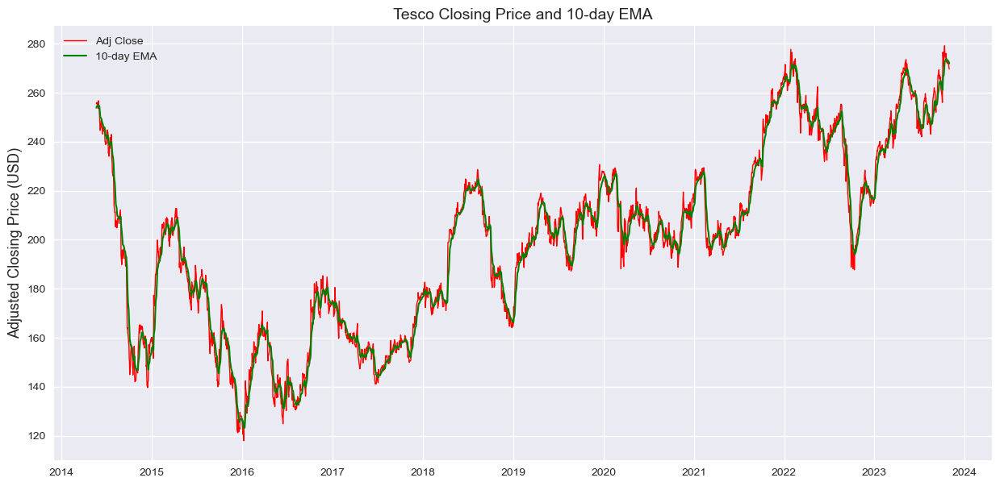

In [20]:
# adjusted closing price and logarithmic returns
# plot the adjusted closing price over data period 
plt.style.use('seaborn')
fig, ax = plt.subplots(1,1, figsize = (15,7))
ax.plot(data.index, 
        data['Close'], 
        color='red', label="Adj Close", linewidth=1)
ax.plot(data.index, 
        data['EMA_10'], 
        color='green', label="10-day EMA", linewidth=1.5)
ax.set_title('Tesco Closing Price and 10-day EMA', fontsize=14)
ax.set_ylabel('Adjusted Closing Price (USD)', fontsize=13)

# Adding legends
lines, labels = ax.get_legend_handles_labels()
ax.legend(lines, labels, loc="upper left")

# show plot
plt.show();

### EDA: plotting closing price vs. Log returns

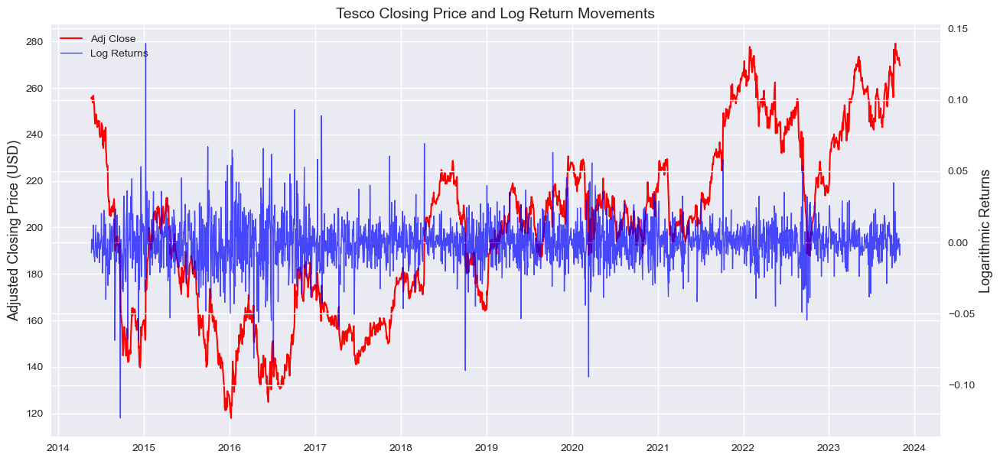

In [21]:
# adjusted closing price and logarithmic returns
# plot the adjusted closing price over data period 
plt.style.use('seaborn')
fig, ax = plt.subplots(1,1, figsize = (15,7))
ax2 = ax.twinx()
ax2.plot(data.index, data['LOGRET'], color='blue', label="Log Returns", alpha=0.7, linewidth=1)
ax.plot(data.index, 
        data['Close'], 
        color='red', label="Adj Close", linewidth=1.5)

# Adding titles and labels
ax.set_title('Tesco Closing Price and Log Return Movements', fontsize=14)
ax.set_ylabel('Adjusted Closing Price (USD)', fontsize=13)
ax2.set_ylabel('Logarithmic Returns', fontsize=13)

# Adding legends
lines, labels = ax.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax.legend(lines + lines2, labels + labels2, loc="upper left")

# Show plot
plt.show();

### EDA: Plotting moving averages of Log returns

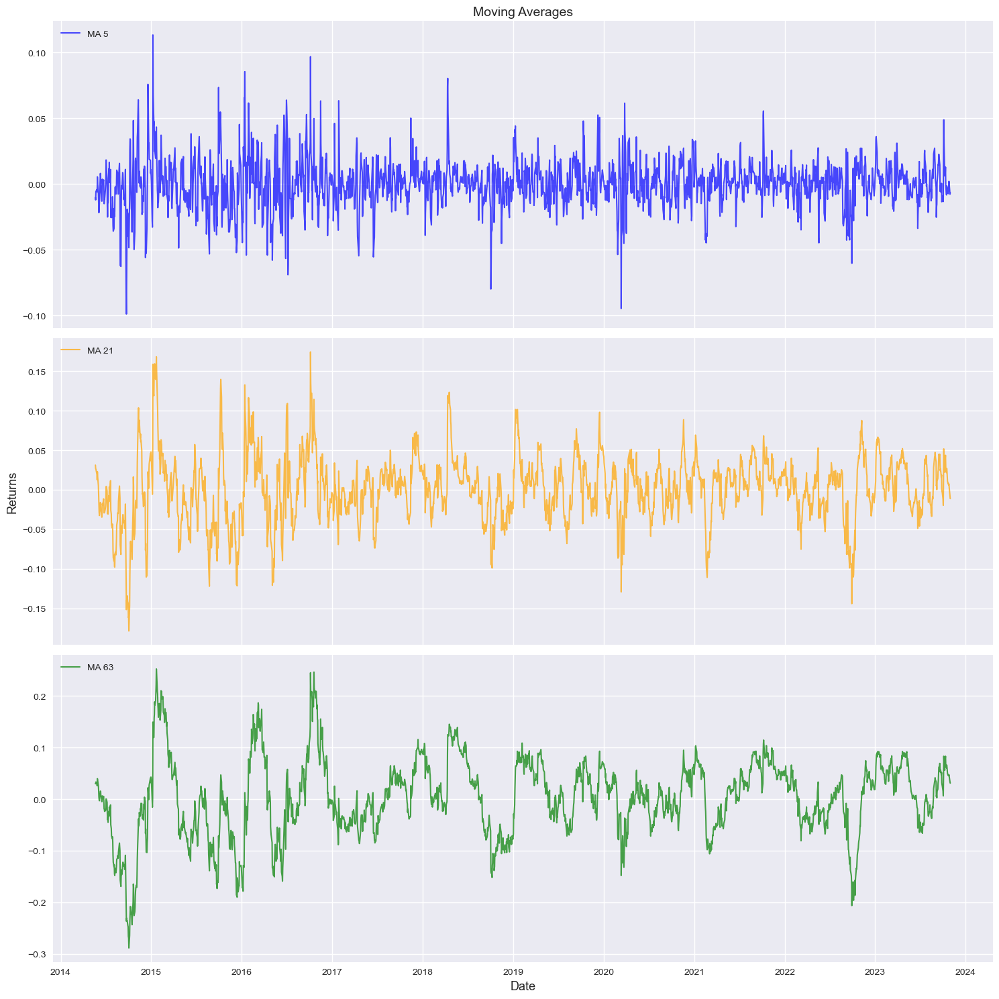

In [22]:
plt.style.use('seaborn')

# Create three stacked vertically
fig, axs = plt.subplots(3, 1, figsize=(15, 15), sharex=True)

# Plotting Moving Averages on separate subplots
axs[0].plot(data.index, data['MA_SCALED_5'], color='blue', label="MA 5", alpha=0.7, linewidth=1.5)
axs[1].plot(data.index, data['MA_SCALED_21'], color='orange', label="MA 21", alpha=0.7, linewidth=1.5)
axs[2].plot(data.index, data['MA_SCALED_63'], color='green', label="MA 63", alpha=0.7, linewidth=1.5)

# Adding titles and labels
axs[0].set_title('Moving Averages', fontsize=14)
axs[2].set_xlabel('Date', fontsize=13)
axs[1].set_ylabel('Returns', fontsize=13)

# Adding legends to subplot
axs[0].legend(loc="upper left")
axs[1].legend(loc="upper left")
axs[2].legend(loc="upper left")

# Adjust layout
plt.tight_layout()

plt.show()

### EDA: Examine Technical Analysis Indicators by category

#### (1) Volatility

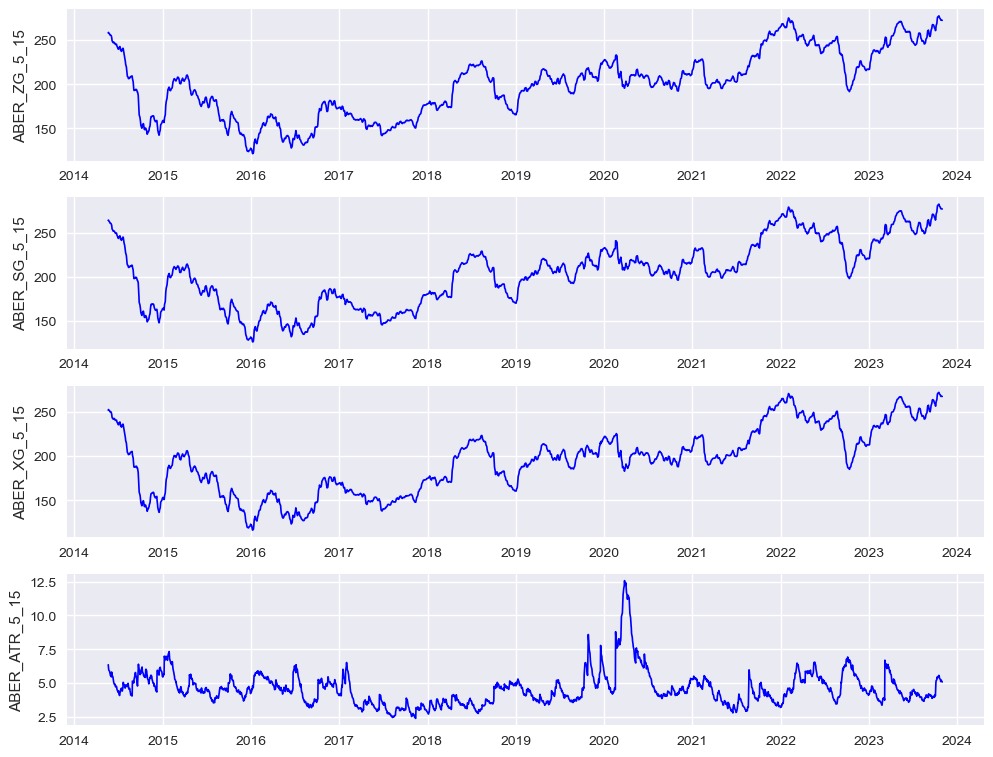

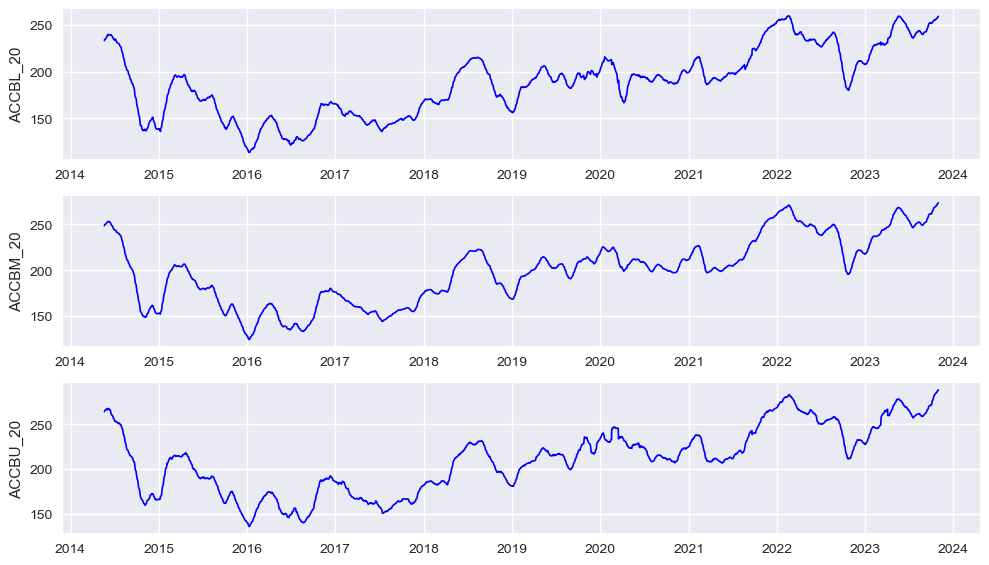

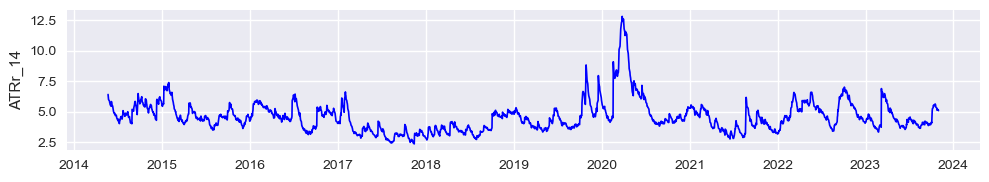

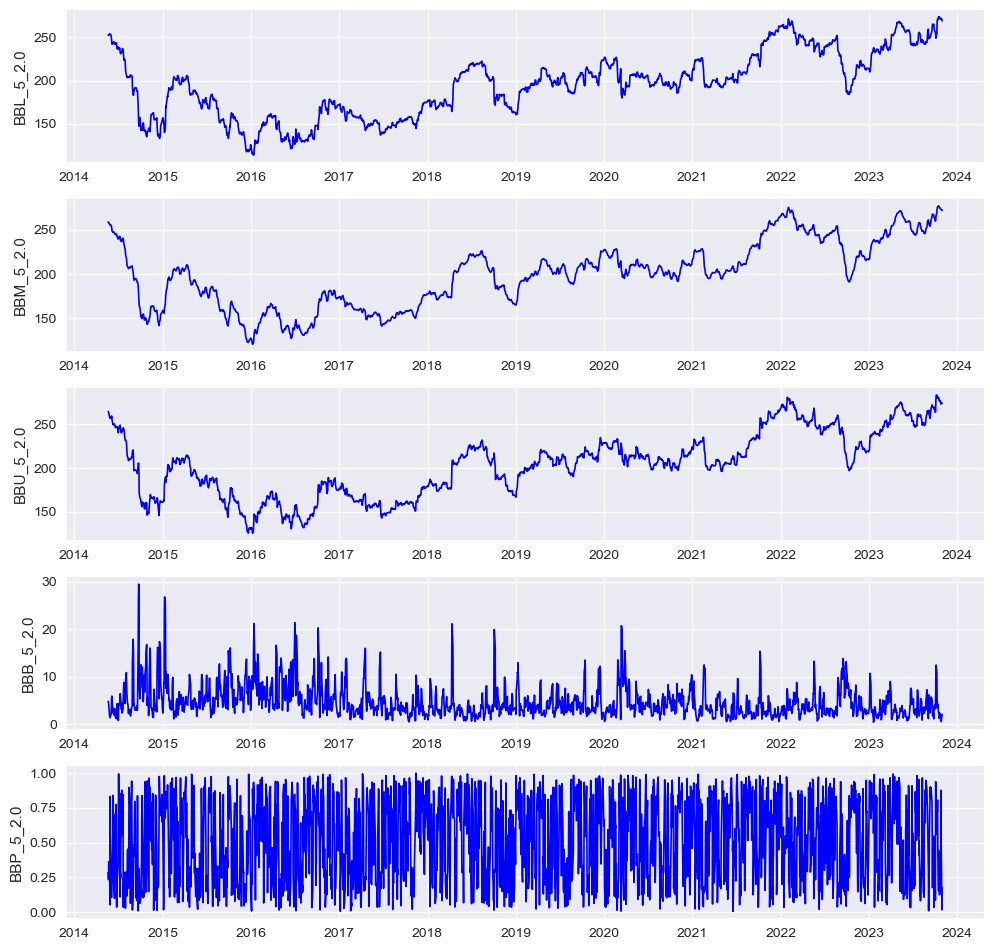

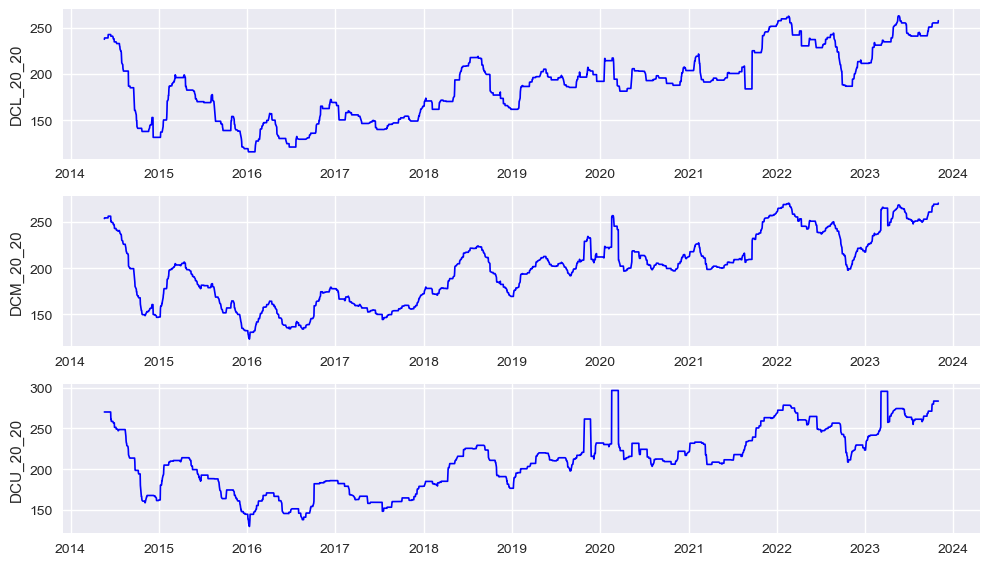

...

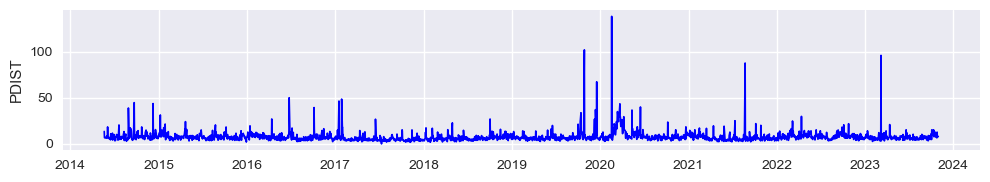

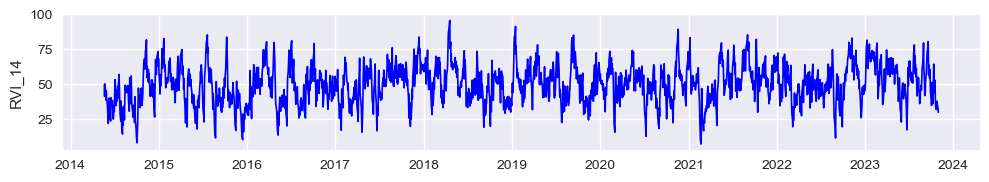

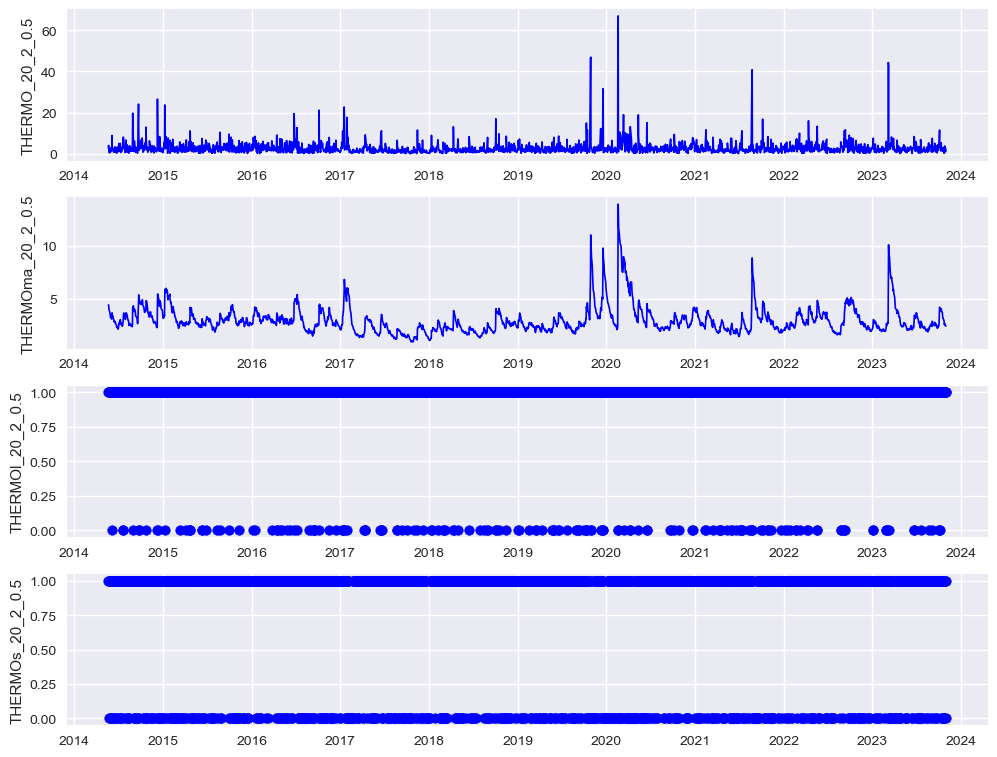

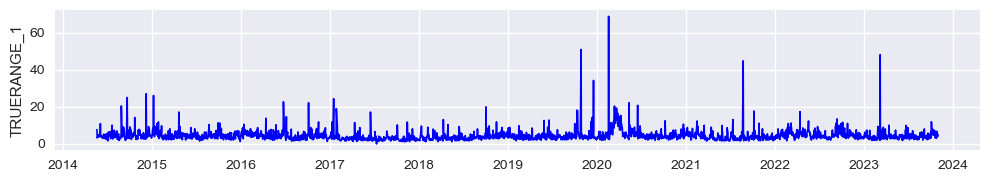

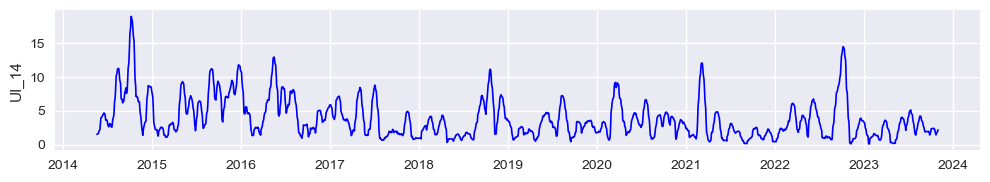

Feature ABER_ZG_5_15 has outliers: 0 | Normal distribution: False
Feature ABER_SG_5_15 has outliers: 0 | Normal distribution: False
Feature ABER_XG_5_15 has outliers: 0 | Normal distribution: False
Feature ABER_ATR_5_15 has outliers: 33 | Normal distribution: False
Feature ACCBL_20 has outliers: 0 | Normal distribution: False
Feature ACCBM_20 has outliers: 0 | Normal distribution: False
Feature ACCBU_20 has outliers: 0 | Normal distribution: False
Feature ATRr_14 has outliers: 35 | Normal distribution: False
Feature BBL_5_2.0 has outliers: 0 | Normal distribution: False
Feature BBM_5_2.0 has outliers: 0 | Normal distribution: False
Feature BBU_5_2.0 has outliers: 0 | Normal distribution: False
Feature BBB_5_2.0 has outliers: 48 | Normal distribution: False
Feature BBP_5_2.0 has outliers: 0 | Normal distribution: False
Feature DCL_20_20 has outliers: 0 | Normal distribution: False
Feature DCM_20_20 has outliers: 0 | Normal distribution: False
Feature DCU_20_20 has outliers: 0 | Normal d

In [23]:
# volatility
aberration = data.filter(regex='^ABER')
acc_bands = data.filter(regex='^ACC')
atr = data.filter(regex='^ATR')
bbands = data.filter(regex='^BB')
donchian = data.filter(regex='^DC')
hwc = data.filter(regex='^HW')
kc = data.filter(regex='^KC')
massi = data.filter(regex='^MASSI')
natr = data.filter(regex='^NATR')
pdist = data.filter(regex='^PDIST')
rvi = data.filter(regex='^RVI')
thermo = data.filter(regex='^THERMO')
true_range = data.filter(regex='^TRUERANGE')
ui = data.filter(regex='^UI')

# Store all dataframes into a list
volatility_indicators = [aberration, acc_bands, atr, bbands, donchian, hwc, kc, massi, natr, pdist, rvi, thermo, true_range, ui]

# Plot each indicator time series
for df in volatility_indicators:
    
    # Create subplots with the number of rows equal to the number of columns in the DataFrame
    fig = plt.figure(figsize=(10, 2 * len(df.columns)))

    # Specify the grid for the subplots
    grid = (len(df.columns), 1)

    # Iterate through each column in the DataFrame
    for i, column in enumerate(df.columns):
        
        # Add subplot to the grid
        ax = plt.subplot2grid(grid, (i, 0))

        # Create scatter plot if data has binary value
        if set(df[column].unique()) == {0, 1}:
            ax.scatter(df.index, df[column], label=column, marker='o', color='blue')
            ax.set_ylabel(column)
        else:
            # Create line plot for continuous values
            ax.plot(df.index, df[column], label=column, linewidth=1.2, color='blue')
            ax.set_ylabel(column)

    # Adjust layout 
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    
    # Display plot
    plt.show()

# check for outliers using Z-score
# check for gaussian distribution using Shapiro-Wilk test
volatility_with_outliers = []
for df in volatility_indicators:
    for i, column in enumerate(df.columns):
        z_scores = stats.zscore(df[column])
        stat, p_value = shapiro(df[column])
        outliers = (z_scores > 3) | (z_scores < -3)
        gaussian = False if p_value < 0.05 else True
        has_outliers = outliers.sum()
        # Iteratively print results
        if has_outliers:
            volatility_with_outliers.append(column)
        print(f"Feature {column} has outliers: {has_outliers} | Normal distribution: {gaussian}")

#### (2) Volume

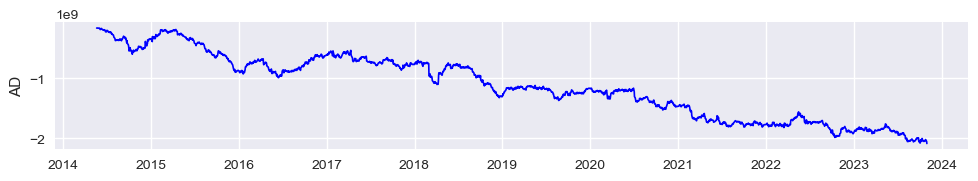

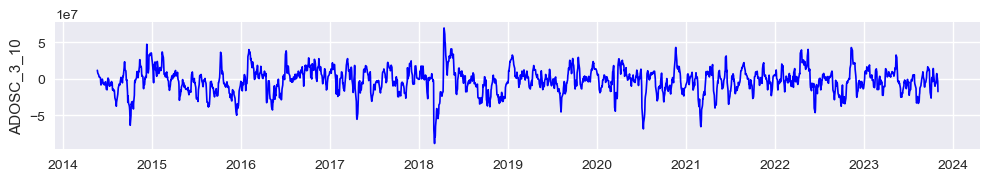

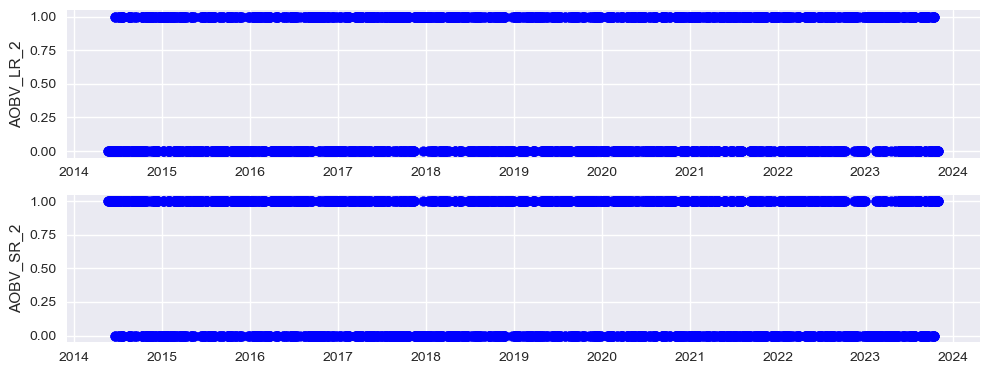

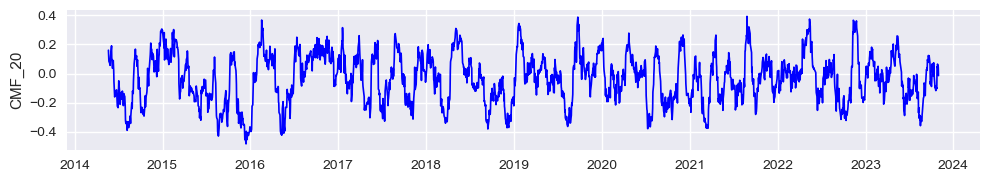

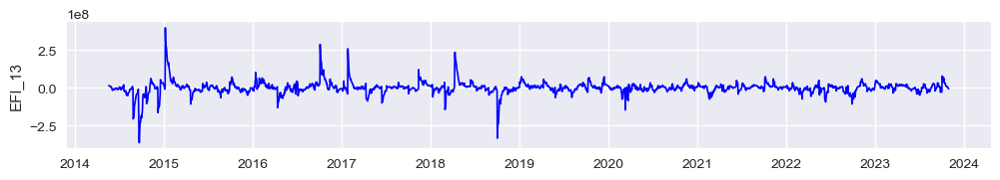

...

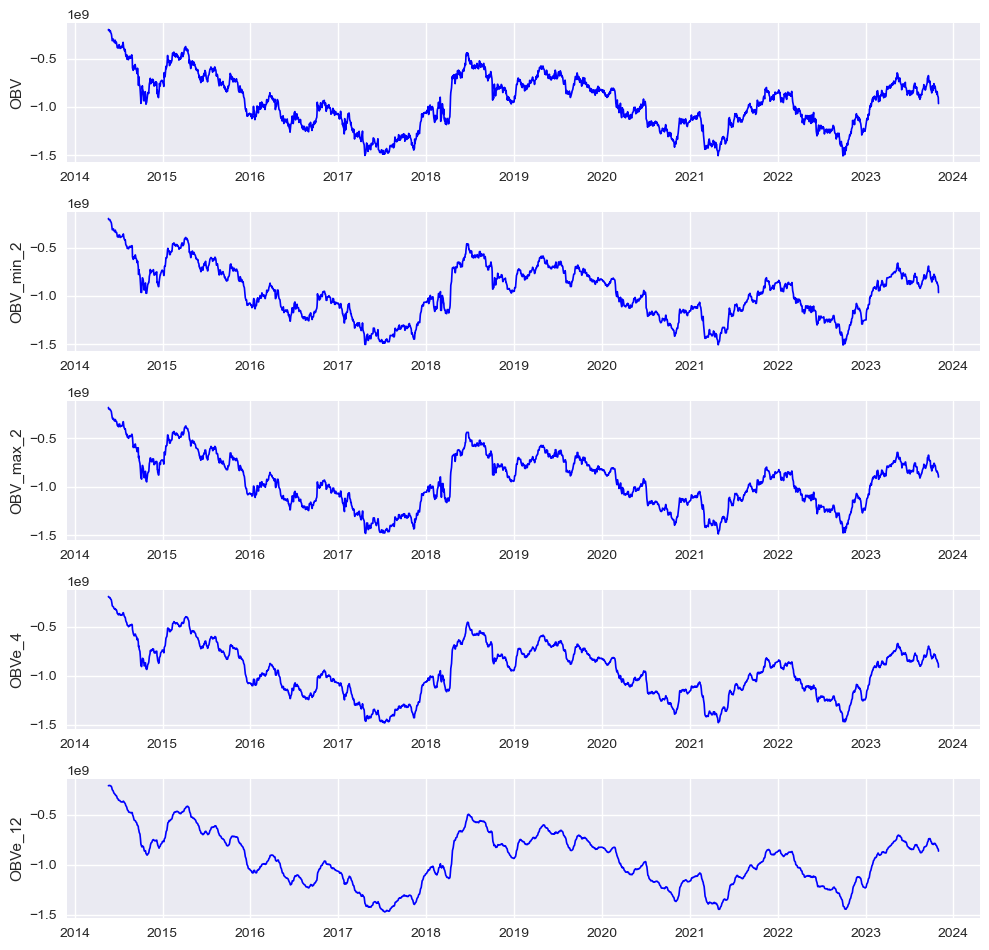

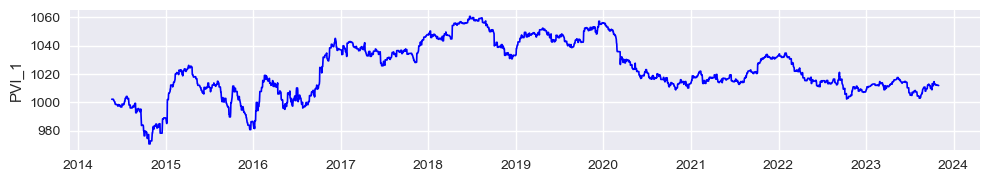

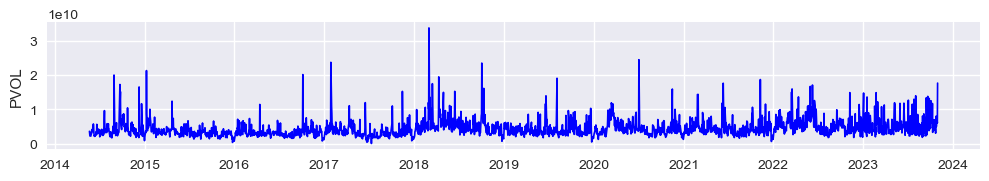

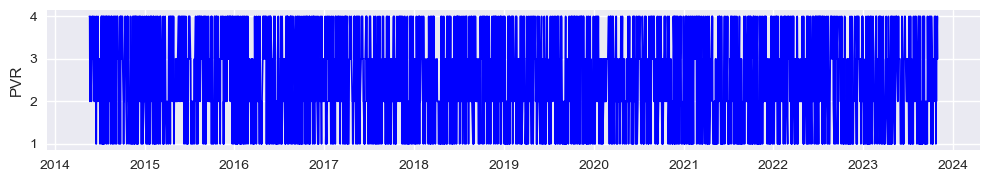

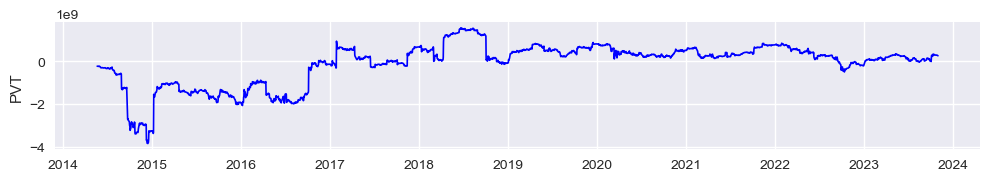

Feature AD has outliers: 0 | Normal distribution: False
Feature ADOSC_3_10 has outliers: 24 | Normal distribution: False
Feature AOBV_LR_2 has outliers: 0 | Normal distribution: False
Feature AOBV_SR_2 has outliers: 0 | Normal distribution: False
Feature CMF_20 has outliers: 0 | Normal distribution: False
Feature EFI_13 has outliers: 53 | Normal distribution: False
Feature KVO_34_55_13 has outliers: 30 | Normal distribution: False
Feature KVOs_34_55_13 has outliers: 20 | Normal distribution: False
Feature MFI_14 has outliers: 0 | Normal distribution: False
Feature NVI_1 has outliers: 0 | Normal distribution: False
Feature OBV has outliers: 0 | Normal distribution: False
Feature OBV_min_2 has outliers: 0 | Normal distribution: False
Feature OBV_max_2 has outliers: 0 | Normal distribution: False
Feature OBVe_4 has outliers: 0 | Normal distribution: False
Feature OBVe_12 has outliers: 0 | Normal distribution: False
Feature PVI_1 has outliers: 0 | Normal distribution: False
Feature PVOL ha

In [24]:
# volume
ad = data[['AD']]
adosc = data.filter(regex='^ADOSC')
aobv = data.filter(regex='^AOBV')
cmf = data.filter(regex='^CMF')
efi = data.filter(regex='^EFI')
kvo = data.filter(regex='^KVO')
mfi = data.filter(regex='^MFI')
nvi = data.filter(regex='^NVI')
obv = data.filter(regex='^OBV')
pvi = data.filter(regex='^PVI')
pvol = data.filter(regex='^PVOL')
pvr = data.filter(regex='^PVR')
pvt = data.filter(regex='^PVT')

# Store all dataframes into a list
volume_indicators = [ad, adosc, aobv, cmf, efi, kvo, mfi, nvi, obv, pvi, pvol, pvr, pvt]

# Plot each indicator time series
for df in volume_indicators:
    
    # Create subplots with the number of rows equal to the number of columns in the DataFrame
    fig = plt.figure(figsize=(10, 2 * len(df.columns)))

    # Specify the grid for the subplots
    grid = (len(df.columns), 1)

    # Iterate through each feature in the DataFrame
    for i, column in enumerate(df.columns):
        # Add subplot to the grid
        ax = plt.subplot2grid(grid, (i, 0))

        # Create scatter plot if data has binary value
        if set(df[column].unique()) == {0, 1}:
            # Scatter plot for binary values
            ax.scatter(df.index, df[column], label=column, marker='o', color='blue')
            ax.set_ylabel(column)
        else:
            # Create line plot for non-binary values
            ax.plot(df.index, df[column], label=column, linewidth=1.2, color='blue')
            ax.set_ylabel(column)

    # Adjust layout 
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    
    # Display plot
    plt.show()

# check for outliers using Z-score
# check for gaussian distribution using Shapiro-Wilk test
volume_with_outliers = []
for df in volume_indicators:
    for i, column in enumerate(df.columns):
        z_scores = stats.zscore(df[column])
        stat, p_value = shapiro(df[column])
        outliers = (z_scores > 3) | (z_scores < -3)
        gaussian = False if p_value < 0.05 else True
        has_outliers = outliers.sum()
        # Iteratively print results
        if has_outliers:
            volume_with_outliers.append(column)
        print(f"Feature {column} has outliers: {has_outliers} | Normal distribution: {gaussian}")

#### (3) Trend

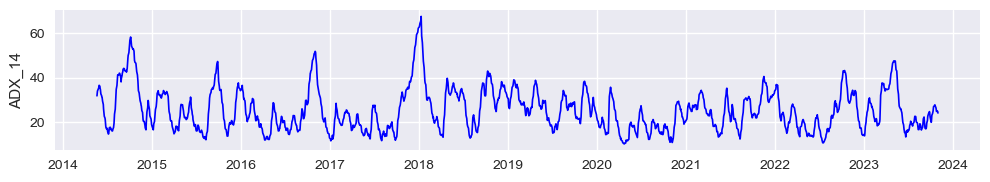

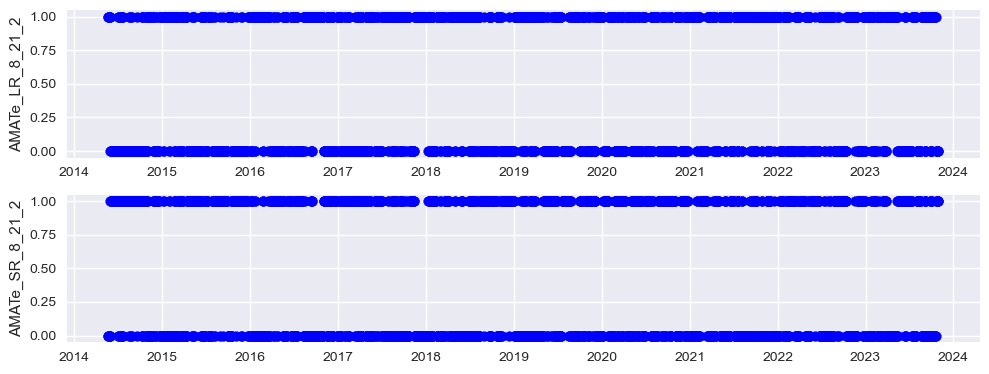

<Figure size 1000x0 with 0 Axes>

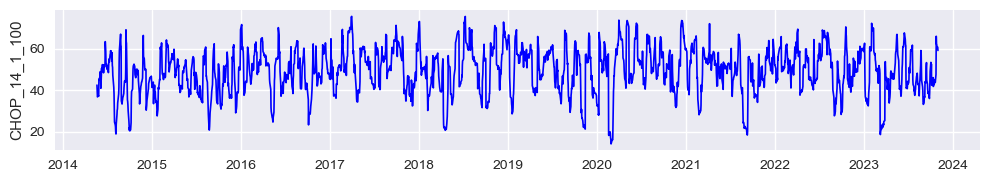

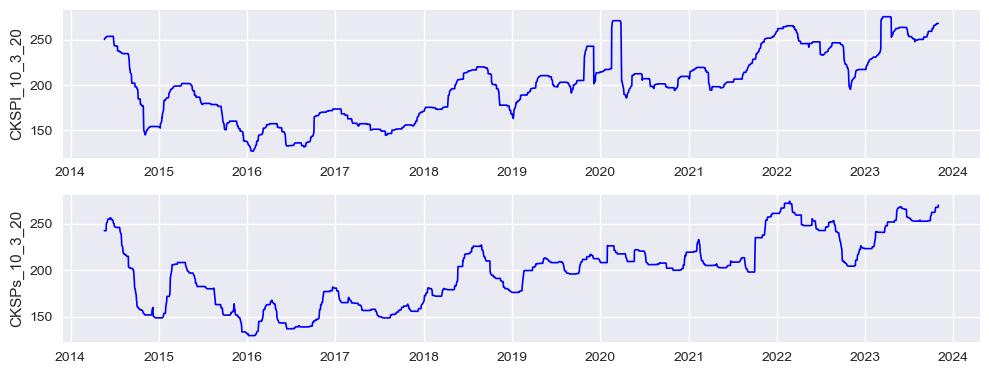

<Figure size 1000x0 with 0 Axes>

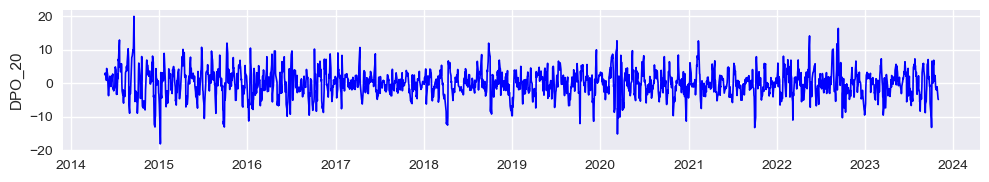

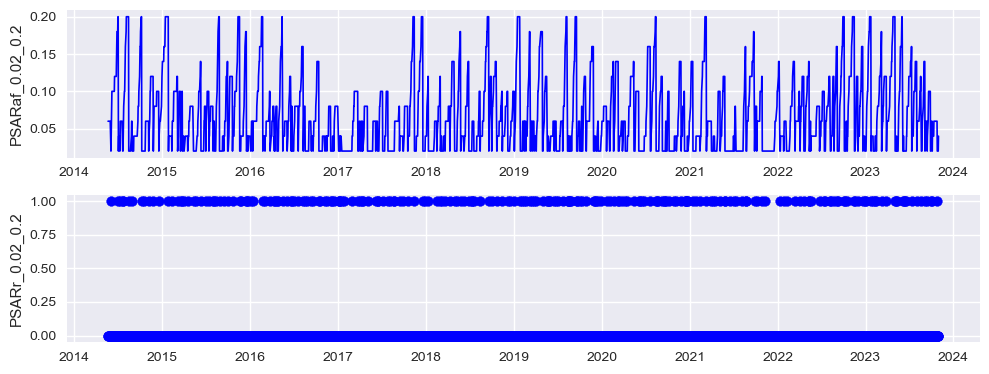

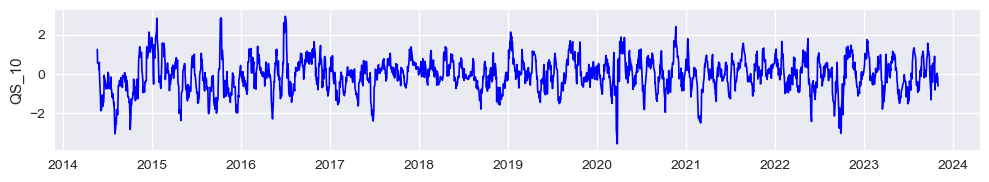

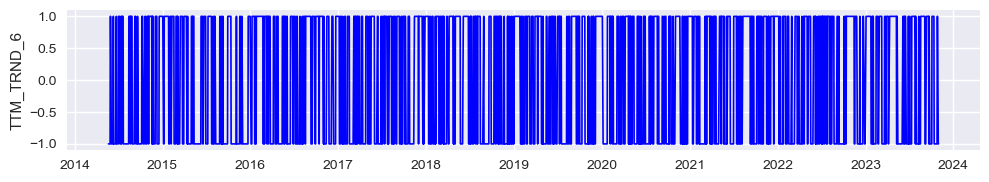

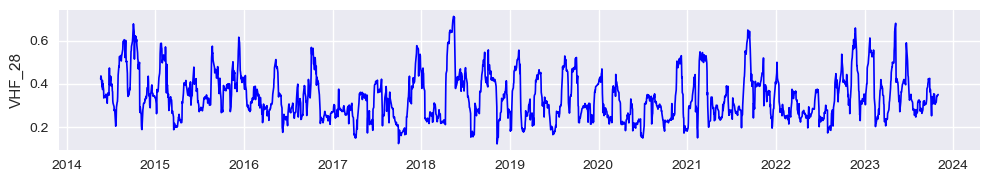

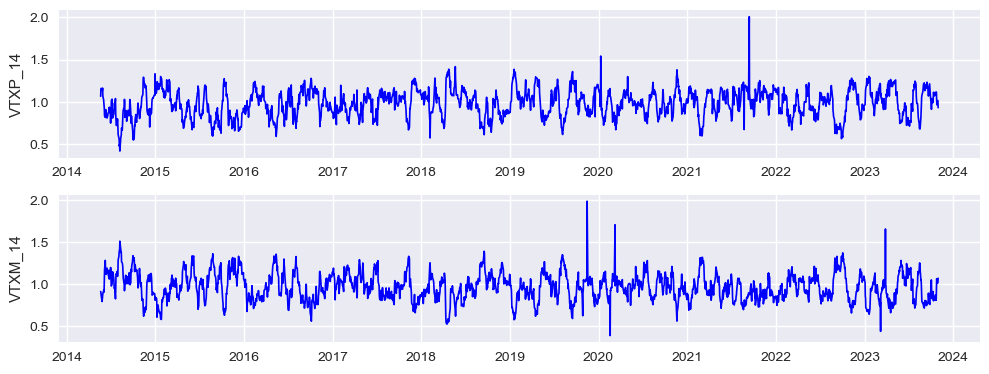

Feature ADX_14 has outliers: 29 | Normal distribution: False
Feature AMATe_LR_8_21_2 has outliers: 0 | Normal distribution: False
Feature AMATe_SR_8_21_2 has outliers: 0 | Normal distribution: False
Feature CHOP_14_1_100 has outliers: 6 | Normal distribution: False
Feature CKSPl_10_3_20 has outliers: 0 | Normal distribution: False
Feature CKSPs_10_3_20 has outliers: 0 | Normal distribution: False
Feature DPO_20 has outliers: 21 | Normal distribution: False
Feature PSARaf_0.02_0.2 has outliers: 0 | Normal distribution: False
Feature PSARr_0.02_0.2 has outliers: 0 | Normal distribution: False
Feature QS_10 has outliers: 21 | Normal distribution: False
Feature TTM_TRND_6 has outliers: 0 | Normal distribution: False
Feature VHF_28 has outliers: 11 | Normal distribution: False
Feature VTXP_14 has outliers: 5 | Normal distribution: False
Feature VTXM_14 has outliers: 6 | Normal distribution: False


In [25]:
# Trend
adx = data.filter(regex='^ADX')
amat = data.filter(regex='^AMAT')
aroon = data.filter(regex='^AROOM')
chop = data.filter(regex='^CHOP')
cksp = data.filter(regex='^CKSP')
decay = data.filter(regex='^LDCAY')
dpo = data.filter(regex='^DPO')
psar = data.filter(regex='^PSAR')
qstick = data.filter(regex='^QS')
ttm = data.filter(regex='^TTM_TRND')
vhf = data.filter(regex='^VHF')
vtx = data.filter(regex='^VTX')

# Store all dataframes into a list
trend_indicators = [adx, amat, aroon, chop, cksp, decay, dpo, psar, qstick, ttm, vhf, vtx]

# Plot each feature time series in each dataframe
for df in trend_indicators:
    
    # Create subplots with the number of rows equal to the number of columns in the DataFrame
    fig = plt.figure(figsize=(10, 2 * len(df.columns)))

    # Specify the grid for the subplots
    grid = (len(df.columns), 1)

    # Iterate through each column in the DataFrame
    for i, column in enumerate(df.columns):
        # Add subplot to the grid
        ax = plt.subplot2grid(grid, (i, 0))

        # Create scatter plot if data has binary value
        if set(df[column].unique()) == {0, 1}:
            ax.scatter(df.index, df[column], label=column, marker='o', color='blue')
            ax.set_ylabel(column)
        else:
        # Create line plot for non-binary values
            ax.plot(df.index, df[column], label=column, linewidth=1.2, color='blue')
            ax.set_ylabel(column)

    # Adjust layout for better spacing
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    
    # Show the plot
    plt.show()

# check for outliers using Z-score
# check for gaussian distribution using Shapiro-Wilk test
trend_with_outliers = []
for df in trend_indicators:
    for i, column in enumerate(df.columns):
        z_scores = stats.zscore(df[column])
        stat, p_value = shapiro(df[column])
        outliers = (z_scores > 3) | (z_scores < -3)
        gaussian = False if p_value < 0.05 else True
        has_outliers = outliers.sum()
        # Iteratively print results
        if has_outliers:
            trend_with_outliers.append(column)
        print(f"Feature {column} has outliers: {has_outliers} | Normal distribution: {gaussian}")
        

#### (4) Statistics

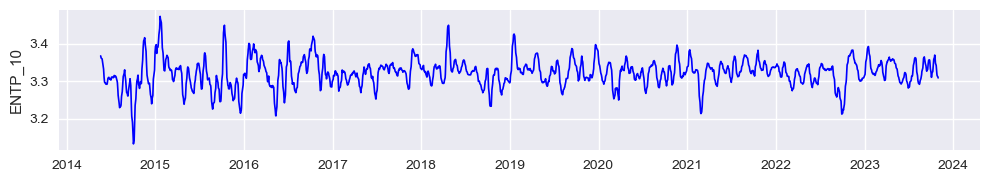

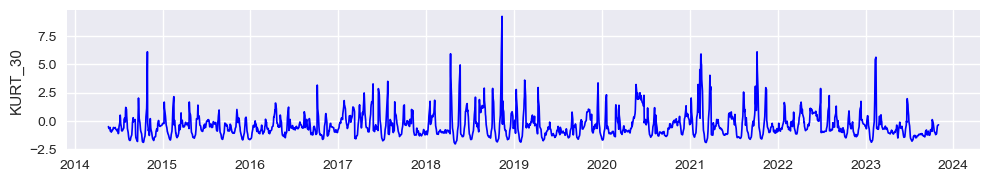

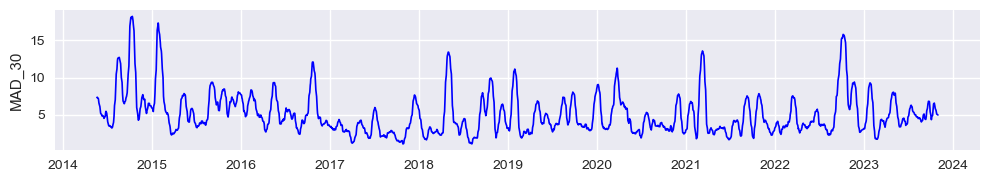

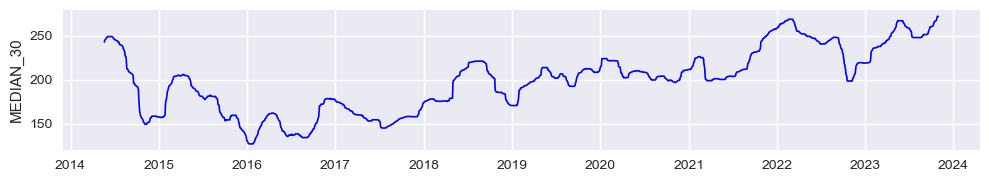

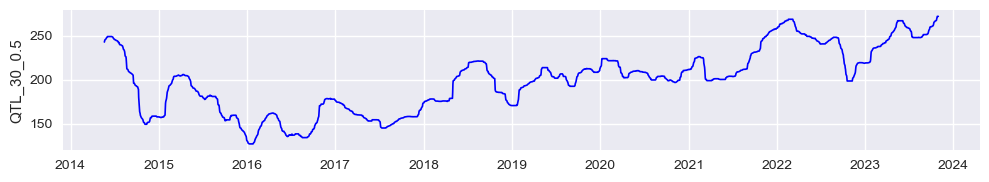

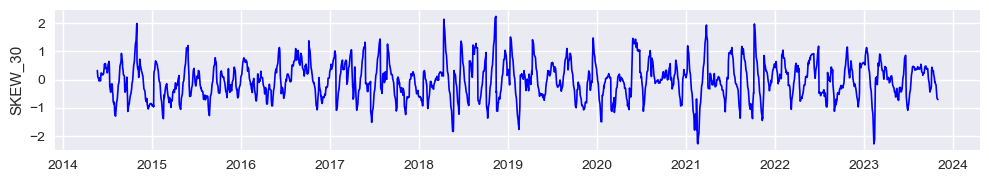

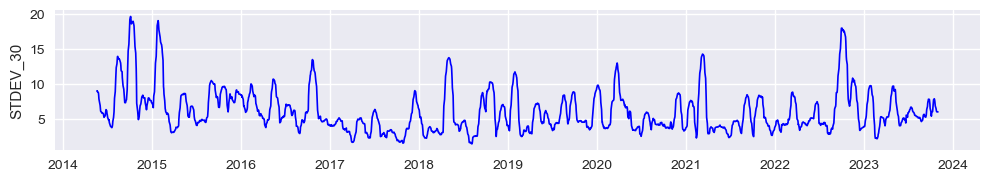

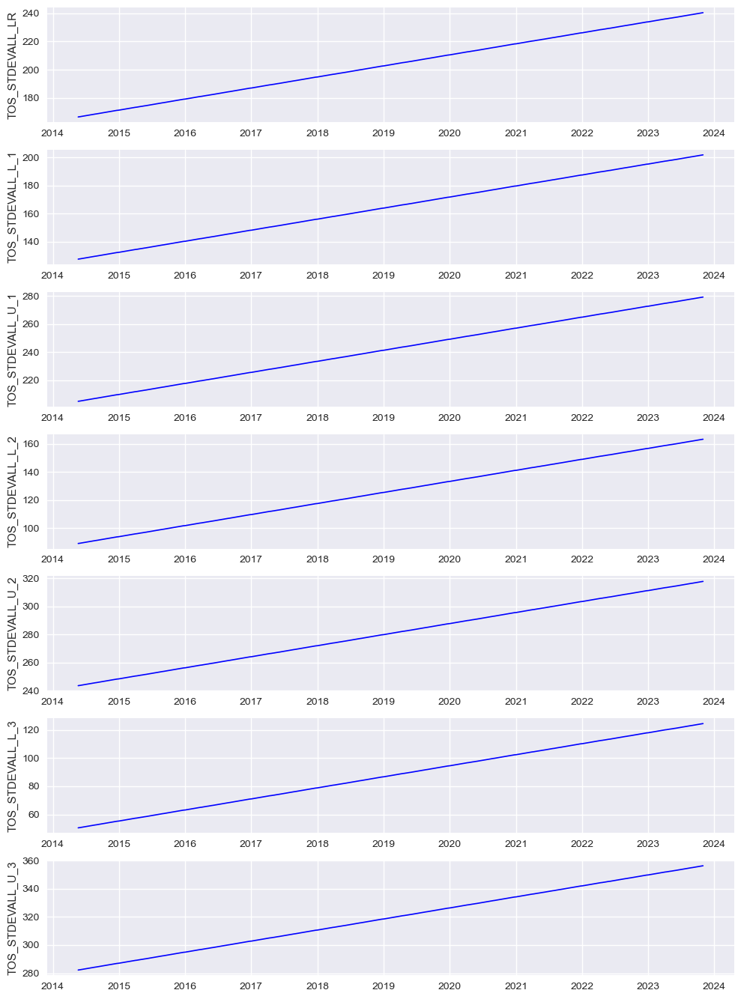

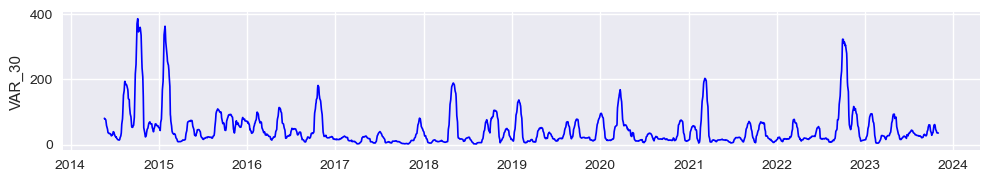

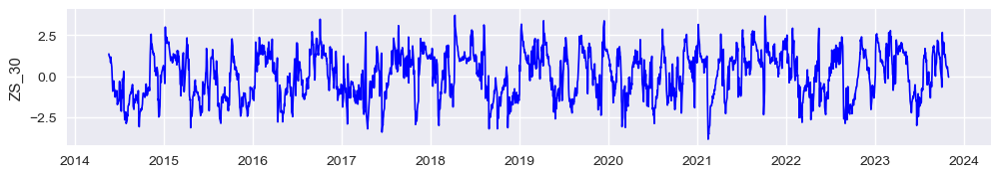

Feature ENTP_10 has outliers: 25 | Normal distribution: False
Feature KURT_30 has outliers: 41 | Normal distribution: False
Feature MAD_30 has outliers: 47 | Normal distribution: False
Feature MEDIAN_30 has outliers: 0 | Normal distribution: False
Feature QTL_30_0.5 has outliers: 0 | Normal distribution: False
Feature SKEW_30 has outliers: 17 | Normal distribution: False
Feature STDEV_30 has outliers: 50 | Normal distribution: False
Feature TOS_STDEVALL_LR has outliers: 0 | Normal distribution: False
Feature TOS_STDEVALL_L_1 has outliers: 0 | Normal distribution: False
Feature TOS_STDEVALL_U_1 has outliers: 0 | Normal distribution: False
Feature TOS_STDEVALL_L_2 has outliers: 0 | Normal distribution: False
Feature TOS_STDEVALL_U_2 has outliers: 0 | Normal distribution: False
Feature TOS_STDEVALL_L_3 has outliers: 0 | Normal distribution: False
Feature TOS_STDEVALL_U_3 has outliers: 0 | Normal distribution: False
Feature VAR_30 has outliers: 58 | Normal distribution: False
Feature ZS_30

In [26]:
# Statistics
entropy = data.filter(regex='^ENTP')
kurtosis = data.filter(regex='^KURT')
mad = data.filter(regex='^MAD')
median = data.filter(regex='^MEDIAN')
quantile = data.filter(regex='^QTL')
skew = data.filter(regex='^SKEW')
stdev = data.filter(regex='^STDEV')
tos_stdevall = data.filter(regex='^TOS_STDEVALL')
variance = data.filter(regex='^VAR')
zscore = data.filter(regex='^ZS')

# Store all indicator filtered dataframe into a list
statistical_indicators = [entropy, kurtosis, mad, median, quantile, skew, stdev, tos_stdevall, variance, zscore]

# Plot each feature time series stored in each dataframe
for df in statistical_indicators:
    
    # Create subplots with the number of rows equal to the number of columns in the DataFrame
    fig = plt.figure(figsize=(10, 2 * len(df.columns)))

    # Specify the grid for the subplots
    grid = (len(df.columns), 1)

    # Iterate through each column in the DataFrame
    for i, column in enumerate(df.columns):
        # Add subplot to the grid
        ax = plt.subplot2grid(grid, (i, 0))

        # Create scatter plot if data has binary value
        if set(df[column].unique()) == {0, 1}:
            ax.scatter(df.index, df[column], label=column, marker='o', color='blue')
            ax.set_ylabel(column)
        else:
            # Create line plot for non-binary values
            ax.plot(df.index, df[column], label=column, linewidth=1.2, color='blue')
            ax.set_ylabel(column)

    # Adjust layout 
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    
    # Display plot
    plt.show()

# check for outliers using Z-score
# check for gaussian distribution using Shapiro-Wilk test
statistical_with_outliers = []
for df in statistical_indicators:
    for i, column in enumerate(df.columns):    
        z_scores = stats.zscore(df[column])
        stat, p_value = shapiro(df[column])
        outliers = (z_scores > 3) | (z_scores < -3)
        gaussian = False if p_value < 0.05 else True
        has_outliers = outliers.sum()
        
        # Iteratively print results
        if has_outliers:
            statistical_with_outliers.append(column)
        print(f"Feature {column} has outliers: {has_outliers} | Normal distribution: {gaussian}") 

#### (5) Momentum

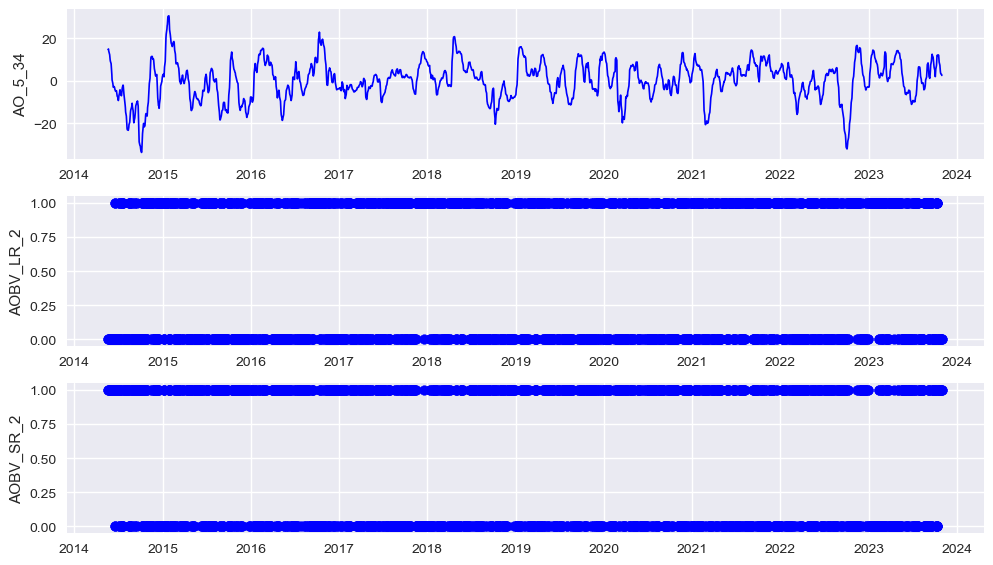

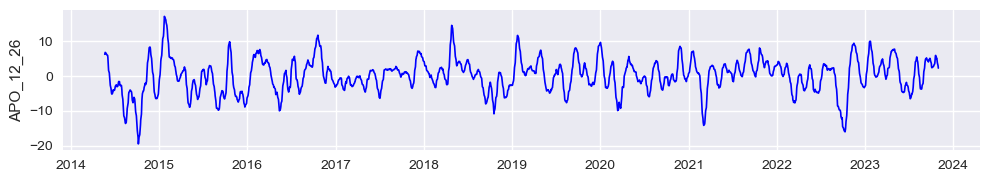

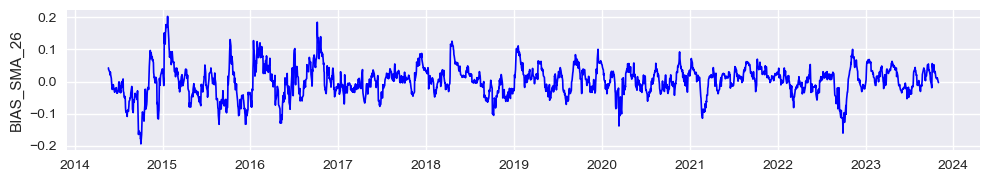

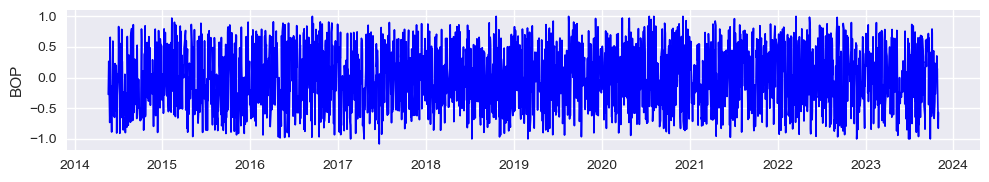

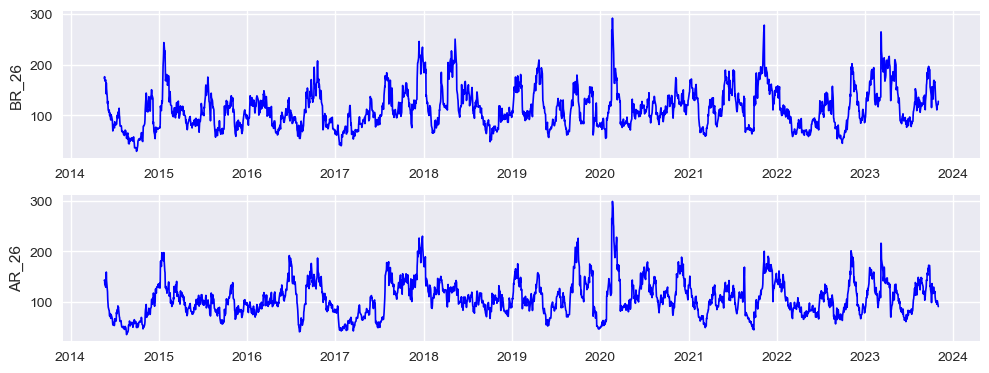

...

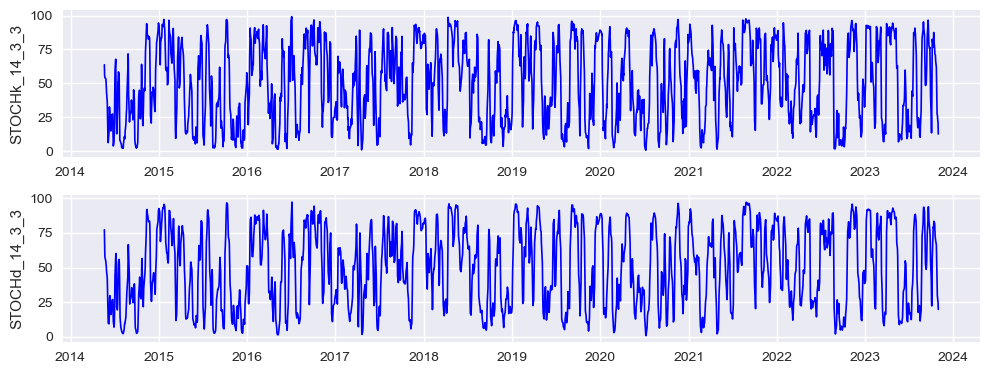

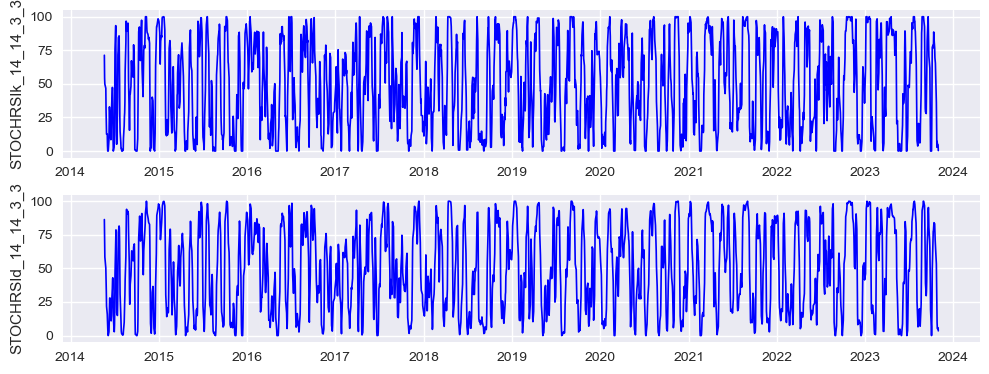

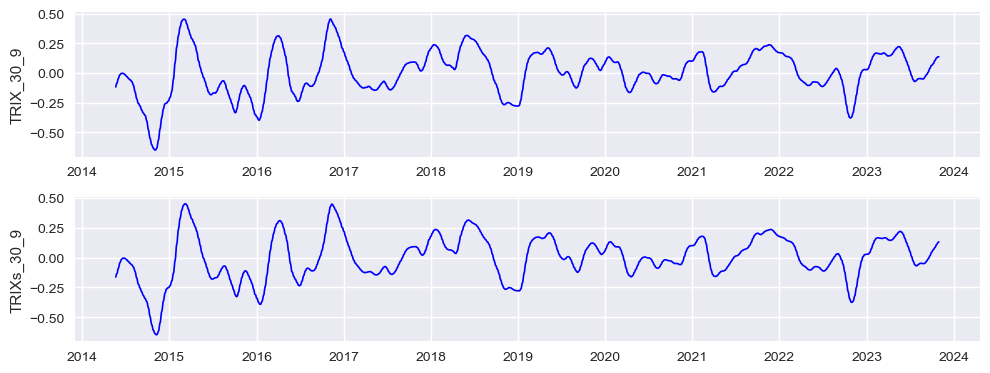

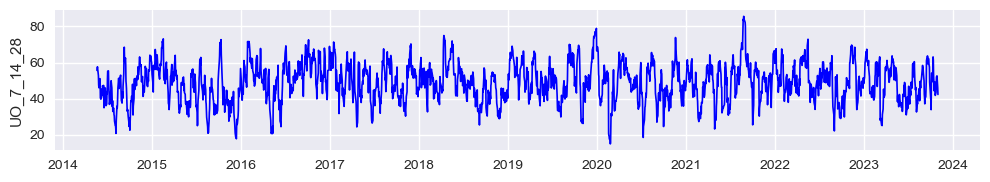

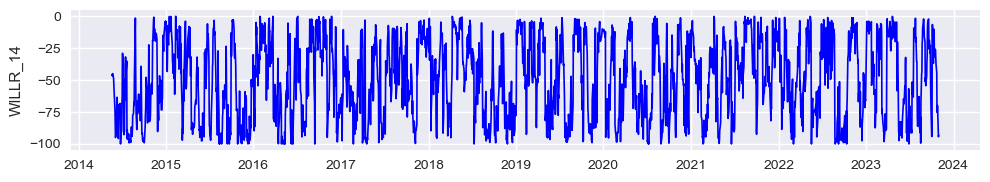

Feature AO_5_34 has outliers: 25 | Normal distribution: False
Feature AOBV_LR_2 has outliers: 0 | Normal distribution: False
Feature AOBV_SR_2 has outliers: 0 | Normal distribution: False
Feature APO_12_26 has outliers: 25 | Normal distribution: False
Feature BIAS_SMA_26 has outliers: 24 | Normal distribution: False
Feature BOP has outliers: 0 | Normal distribution: False
Feature BR_26 has outliers: 17 | Normal distribution: False
Feature AR_26 has outliers: 17 | Normal distribution: False
Feature CCI_14_0.015 has outliers: 7 | Normal distribution: False
Feature CFO_9 has outliers: 34 | Normal distribution: False
Feature CG_10 has outliers: 36 | Normal distribution: False
Feature CMO_14 has outliers: 1 | Normal distribution: False
Feature COPC_11_14_10 has outliers: 23 | Normal distribution: False
Feature CTI_12 has outliers: 0 | Normal distribution: False
Feature DMP_14 has outliers: 43 | Normal distribution: False
Feature DMN_14 has outliers: 39 | Normal distribution: False
Feature E

In [27]:
# Momentum
ao = data.filter(regex='^AO')
apo = data.filter(regex='^APO')
bias = data.filter(regex='^BIAS')
bop = data.filter(regex='^BOP')
brar = data[['BR_26','AR_26']]
cci = data.filter(regex='^CCI')
cfo = data.filter(regex='^CFO')
cg = data.filter(regex='^CG')
cmo = data.filter(regex='^CMO')
coppock = data.filter(regex='^COPC')

cti = data.filter(regex='^CTI')
dm = data.filter(regex='^DM')
er = data.filter(regex='^ER_')
fisher = data.filter(regex='^FISHER')
inertia = data.filter(regex='^INERTIA')
kdj = data[['K_9_3', 'D_9_3', 'J_9_3']]
kst = data.filter(regex='^KST')
macd = data.filter(regex='^MACD')
mom = data.filter(regex='^MOM')

pgo = data.filter(regex='^PGO')
ppo = data.filter(regex='^PPO')
psl = data.filter(regex='^PSL')
pvo = data.filter(regex='^PVO')
qqe = data.filter(regex='^QQE')
roc = data.filter(regex='^ROC')
rsi = data.filter(regex='^RSI')
rvgi = data.filter(regex='^RVGI')
stc = data.filter(regex='^STC')
slope = data.filter(regex='^SLOPE')

smi = data.filter(regex='^SMI')
squeeze = data.filter(regex='^SQZ_')
squeeze_pro = data.filter(regex='^SQZPRO')
stoch = data[['STOCHk_14_3_3','STOCHd_14_3_3']]
stochrsi = data.filter(regex='^STOCHRSI')
trix = data.filter(regex='^TRIX')
tsi = data.filter(regex='^TSI')
uo = data.filter(regex='^UO')
willr = data.filter(regex='^WILLR')

# Store all indicator filtered dataframe into a list
momentum_indicators = [ao, apo, bias, bop, brar, cci, cfo, cg, cmo, coppock, cti, dm, er, fisher, inertia, kdj, kst, macd, mom, 
                      pgo, ppo, psl, pvo, qqe, roc, rsi, rvgi, stc, slope, smi, squeeze, squeeze_pro, stoch, stochrsi, trix, uo, willr]

# Plot each feature time series stored in each dataframe
for df in momentum_indicators:
    
    # Create subplots with the number of rows equal to the number of columns in the DataFrame
    fig = plt.figure(figsize=(10, 2 * len(df.columns)))

    # Specify the grid for the subplots
    grid = (len(df.columns), 1)

    # Iterate through each column in the DataFrame
    for i, column in enumerate(df.columns):
        # Add subplot to the grid
        ax = plt.subplot2grid(grid, (i, 0))

        # Create scatter plot if data has binary value
        if set(df[column].unique()) == {0, 1}:
            ax.scatter(df.index, df[column], label=column, marker='o', color='blue')
            ax.set_ylabel(column)
        else:
            # Create line plot for non-binary values
            ax.plot(df.index, df[column], label=column, linewidth=1.2, color='blue')
            ax.set_ylabel(column)

    # Adjust layout
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    
    # Display plot
    plt.show()

# Check for outliers using Z-score
# Check for gaussian distribution using Shapiro-Wilk test
momentum_with_outliers = []
for df in momentum_indicators:
    for i, column in enumerate(df.columns): 
        z_scores = stats.zscore(df[column])
        stat, p_value = shapiro(df[column])
        outliers = (z_scores > 3) | (z_scores < -3)
        gaussian = False if p_value < 0.05 else True
        has_outliers = outliers.sum()
        
        # Iteratively print results
        if has_outliers:
            momentum_with_outliers.append(column)
        print(f"Feature {column} has outliers: {has_outliers} | Normal distribution: {gaussian}")
        

#### (6) Overlap

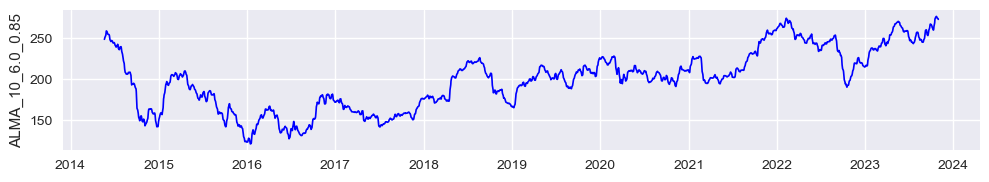

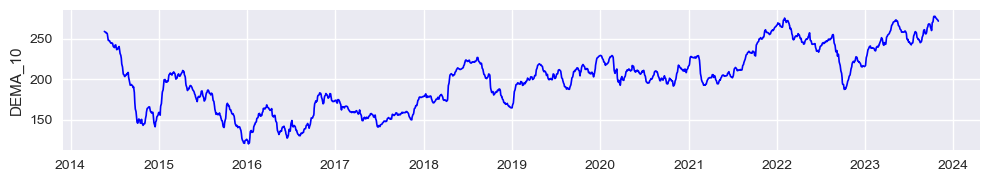

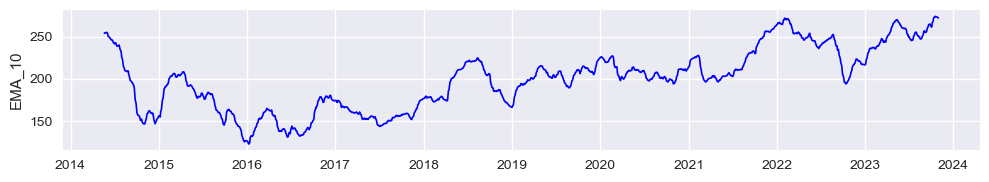

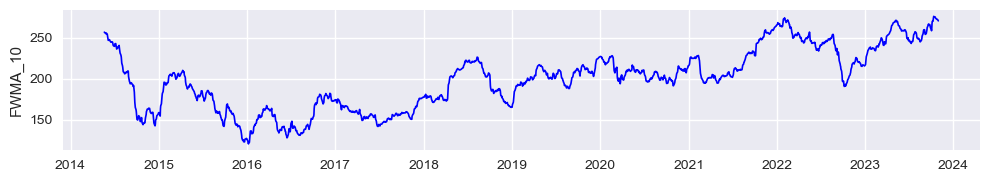

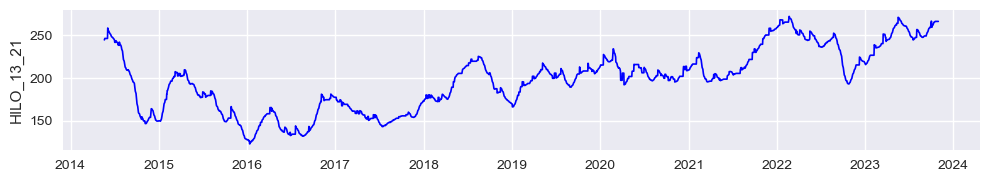

...

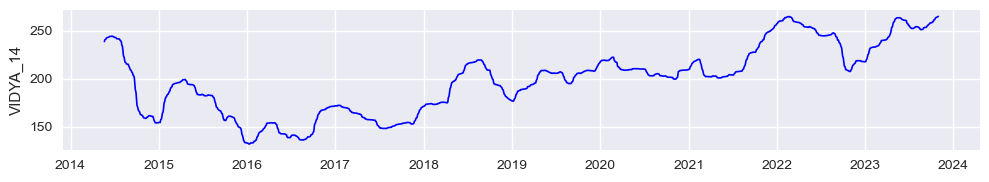

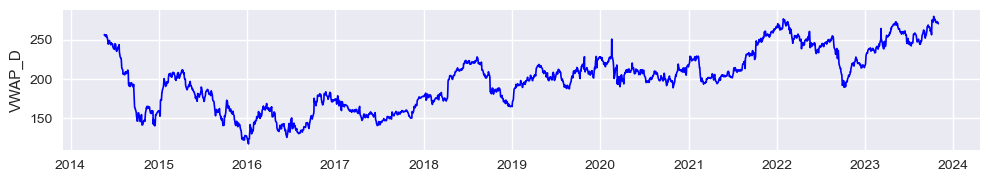

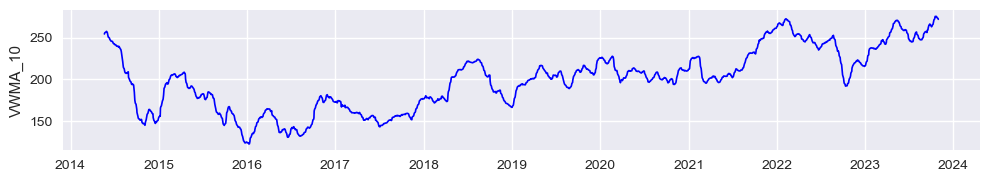

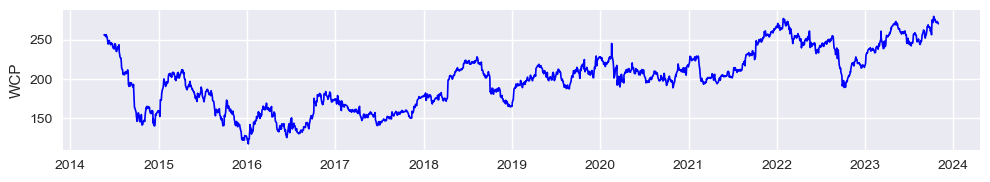

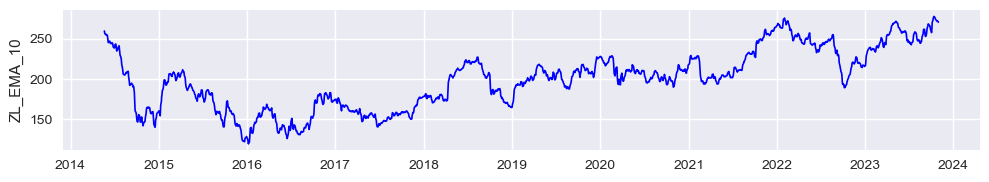

Feature ALMA_10_6.0_0.85 has outliers: 0 | Normal distribution: False
Feature DEMA_10 has outliers: 0 | Normal distribution: False
Feature EMA_10 has outliers: 0 | Normal distribution: False
Feature FWMA_10 has outliers: 0 | Normal distribution: False
Feature HILO_13_21 has outliers: 0 | Normal distribution: False
Feature HL2 has outliers: 0 | Normal distribution: False
Feature HLC3 has outliers: 0 | Normal distribution: False
Feature HMA_10 has outliers: 0 | Normal distribution: False
Feature HWMA_0.2_0.1_0.1 has outliers: 0 | Normal distribution: False
Feature JMA_7_0 has outliers: 0 | Normal distribution: False
Feature KAMA_10_2_30 has outliers: 0 | Normal distribution: False
Feature LR_14 has outliers: 0 | Normal distribution: False
Feature MCGD_10 has outliers: 0 | Normal distribution: False
Feature MIDPOINT_2 has outliers: 0 | Normal distribution: False
Feature MIDPRICE_2 has outliers: 0 | Normal distribution: False
Feature OHLC4 has outliers: 0 | Normal distribution: False
Featu

In [28]:
# Overlap
alma = data.filter(regex='^ALMA')
dema = data.filter(regex='^DEMA')
ema = data.filter(regex='^EMA')
fwma = data.filter(regex='^FWMA')
hilo= data.filter(regex='^HILO')
hl2 = data.filter(regex='^HL2')
hlc3 = data.filter(regex='^HLC3')
hma = data.filter(regex='^HMA')
hwma = data.filter(regex='^HWMA')

jma = data.filter(regex='^JMA')
kama = data.filter(regex='^KAMA')
linreg = data.filter(regex='^LR')
mcgd = data.filter(regex='^MCGD')
midpoint = data.filter(regex='^MIDPOINT')
midprice = data.filter(regex='^MIDPRICE')
ohlc4 = data.filter(regex='^OHLC4')
pwma = data.filter(regex='^PWMA')
rma = data.filter(regex='^RMA')

sinwma = data.filter(regex='^SINWMA')
sma = data.filter(regex='^SMA')
ssf = data.filter(regex='^SSF')
supertrend = data.filter(regex='^SUPERT')
swma = data.filter(regex='^SWMA')
t3 = data.filter(regex='^T3')
tema = data.filter(regex='^TEMA')
trima = data.filter(regex='^TRIMA')
vidya = data.filter(regex='^VIDYA')
vwap = data.filter(regex='^VWAP')
vwma = data.filter(regex='^VWMA')
wcp = data.filter(regex='^WCP')
zlma = data.filter(regex='^ZL')

# Store all indicator filtered dataframe into a list
overlap_indicators = [alma, dema, ema, fwma, hilo, hl2, hlc3, hma, hwma, jma, kama, linreg, mcgd, midpoint, midprice, ohlc4, pwma, rma,
                     sinwma, sma, ssf, supertrend, swma, t3, tema, trima, vidya, vwap, vwma, wcp, zlma]

# Plot each feature time series stored in each dataframe
for df in overlap_indicators:
    
    # Create subplots with the number of rows equal to the number of columns in the DataFrame
    fig = plt.figure(figsize=(10, 2 * len(df.columns)))

    # Specify the grid for the subplots
    grid = (len(df.columns), 1)

    # Iterate through each column in the DataFrame
    for i, column in enumerate(df.columns):
        # Add subplot to the grid
        ax = plt.subplot2grid(grid, (i, 0))

        # Create scatter plot if data has binary value
        if set(df[column].unique()) == {0, 1}:
            ax.scatter(df.index, df[column], label=column, marker='o', color='blue')
            ax.set_ylabel(column)
        else:
            # Create line plot for non-binary values
            ax.plot(df.index, df[column], label=column, linewidth=1.2, color='blue')
            ax.set_ylabel(column)

    # Adjust layout 
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    
    # Display plot
    plt.show()

# check for outliers using Z-score
# check for gaussian distribution using Shapiro-Wilk test
overlap_with_outliers = []
for df in overlap_indicators:
    for i, column in enumerate(df.columns):
        z_scores = stats.zscore(df[column])
        stat, p_value = shapiro(df[column])
        outliers = (z_scores > 3) | (z_scores < -3)
        gaussian = False if p_value < 0.05 else True
        has_outliers = outliers.sum()
        
        # Iteratively print results
        if has_outliers:
            overlap_with_outliers.append(column)
        print(f"Feature {column} has outliers: {has_outliers} | Normal distribution: {gaussian}")
        

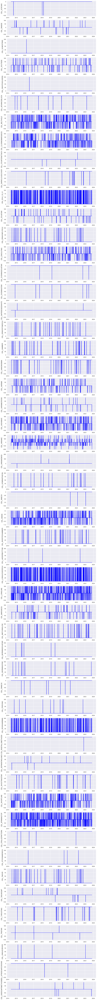

Feature CDL_2CROWS has outliers: 3 | Normal distribution: False
Feature CDL_3INSIDE has outliers: 27 | Normal distribution: False
Feature CDL_3LINESTRIKE has outliers: 1 | Normal distribution: False
Feature CDL_3OUTSIDE has outliers: 104 | Normal distribution: False
Feature CDL_3WHITESOLDIERS has outliers: 1 | Normal distribution: False
Feature CDL_ADVANCEBLOCK has outliers: 10 | Normal distribution: False
Feature CDL_BELTHOLD has outliers: 0 | Normal distribution: False
Feature CDL_CLOSINGMARUBOZU has outliers: 0 | Normal distribution: False
Feature CDL_COUNTERATTACK has outliers: 5 | Normal distribution: False
Feature CDL_DARKCLOUDCOVER has outliers: 14 | Normal distribution: False
Feature CDL_DOJI_10_0.1 has outliers: 0 | Normal distribution: False
Feature CDL_DOJISTAR has outliers: 64 | Normal distribution: False
Feature CDL_DRAGONFLYDOJI has outliers: 39 | Normal distribution: False
Feature CDL_ENGULFING has outliers: 211 | Normal distribution: False
Feature CDL_EVENINGDOJISTAR ha

In [29]:
# candles
candle_indicators = data.filter(regex='^CDL_')

# Store all indicator filtered dataframe into a list
for df in [candle_indicators]:
    
    # Create subplots with the number of rows equal to the number of columns in the DataFrame
    fig = plt.figure(figsize=(10, 2 * len(df.columns)))

    # Specify the grid for the subplots
    grid = (len(df.columns), 1)

    # Iterate through each column in the DataFrame
    for i, column in enumerate(df.columns):
        # Add subplot to the grid
        ax = plt.subplot2grid(grid, (i, 0))

        # Create scatter plot if data has binary value
        if set(df[column].unique()) == {0, 1}:
            ax.scatter(df.index, df[column], label=column, marker='o', color='blue')
            ax.set_ylabel(column)
        else:
            # Create line plot for non-binary values
            ax.plot(df.index, df[column], label=column, linewidth=1.2, color='blue')
            ax.set_ylabel(column)

    # Adjust layout
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    
    # Display plot
    plt.show()

# check for outliers using Z-score
# check for gaussian distribution using Shapiro-Wilk test
for df in [candle_indicators]:
    for i, column in enumerate(df.columns):
        
        z_scores = stats.zscore(df[column])
        stat, p_value = shapiro(df[column])
        outliers = (z_scores > 3) | (z_scores < -3)
        gaussian = False if p_value < 0.05 else True
        
        # Iteratively print results
        print(f"Feature {column} has outliers: {outliers.sum()} | Normal distribution: {gaussian}")
        

In [46]:
candle_indicators.shape

(2387, 53)

#### EDA: Count number of features with outliers (tentative - only those from the TA library)

In [30]:
cols_with_outliers = volatility_with_outliers + volume_with_outliers + trend_with_outliers + statistical_with_outliers + overlap_with_outliers + momentum_with_outliers
len(cols_with_outliers)

75

### EDA: Preliminary Correlation Analysis

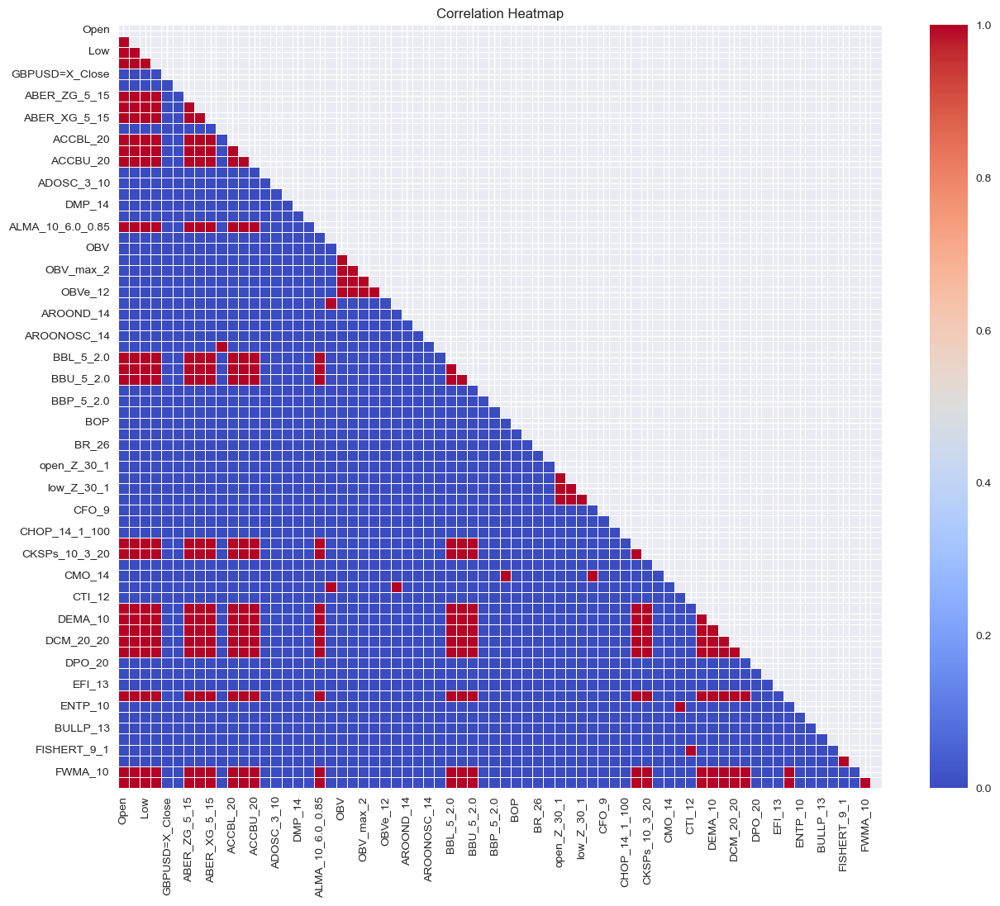

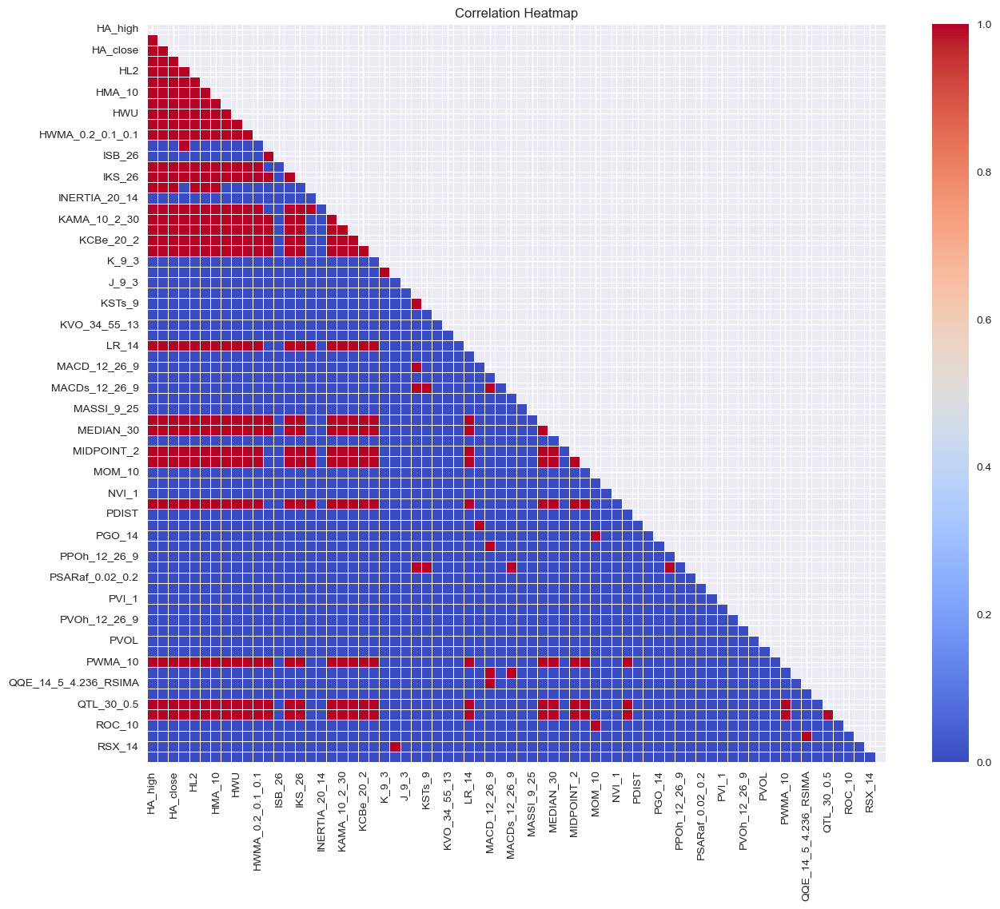

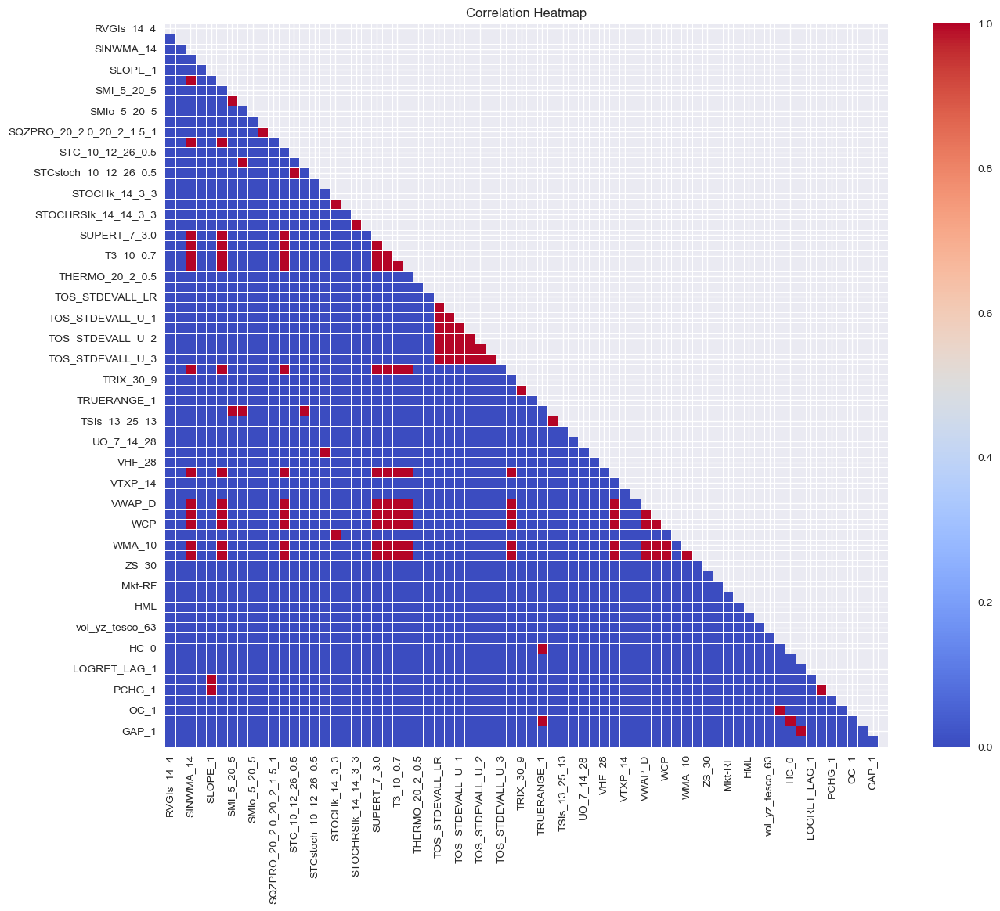

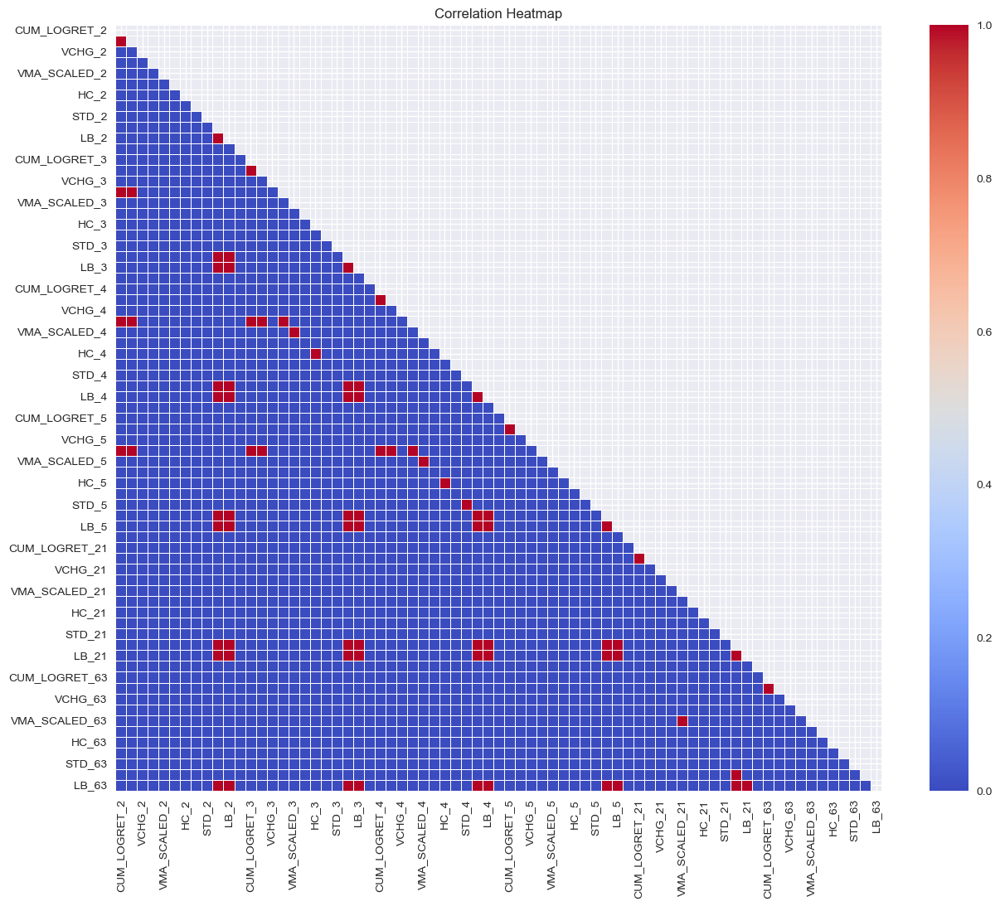

In [31]:
# Distinguish between numerical and categorical columns
numerical_data = data[data.columns[data.nunique() >= 10]]
categorical_data = data[data.columns[data.nunique() < 10]]

# Split the columns into four groups
num_columns = len(numerical_data.columns)
group_size = num_columns // 4
group1 = numerical_data.iloc[:, :group_size]
group2 = numerical_data.iloc[:, group_size:2*group_size]
group3 = numerical_data.iloc[:, 2*group_size:3*group_size]
group4 = numerical_data.iloc[:, 3*group_size:]

# Function to plot correlation heatmap with a given boundary
def plot_correlation_heatmap(data_group, threshold=0.9):
    # Compute the correlation matrix
    correlation_matrix = data_group.corr()>threshold

    # Create mask to hide the upper triangle of the heatmap
    mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

    # Set up the matplotlib figure
    plt.figure(figsize=(15, 12))

    # Draw the heatmap with the mask and correct aspect ratio
    sns.heatmap(correlation_matrix, mask=mask, cmap="coolwarm",
                square=True, annot=False, linewidths=.5)

    # Set plot title
    plt.title('Correlation Heatmap')

    # Display plot
    plt.show()

# Plot correlation heatmaps for each group
plot_correlation_heatmap(group1)
plot_correlation_heatmap(group2)
plot_correlation_heatmap(group3)
plot_correlation_heatmap(group4)

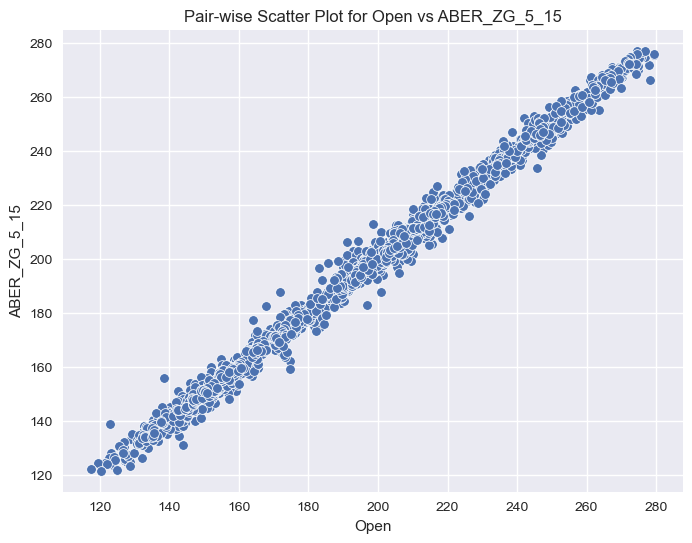

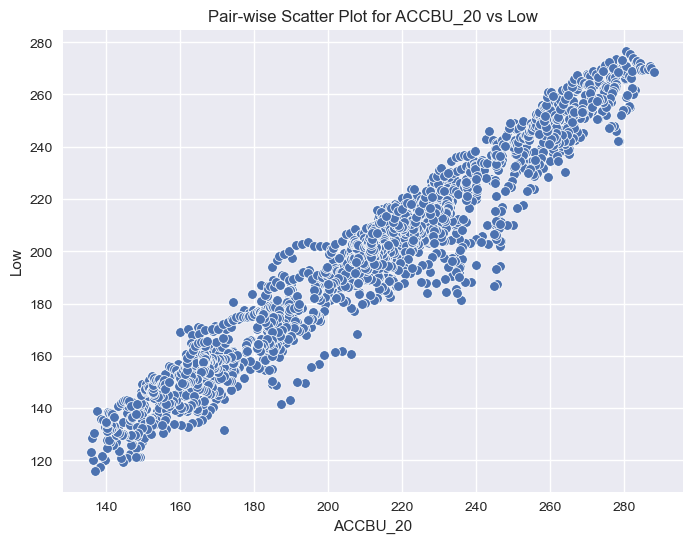

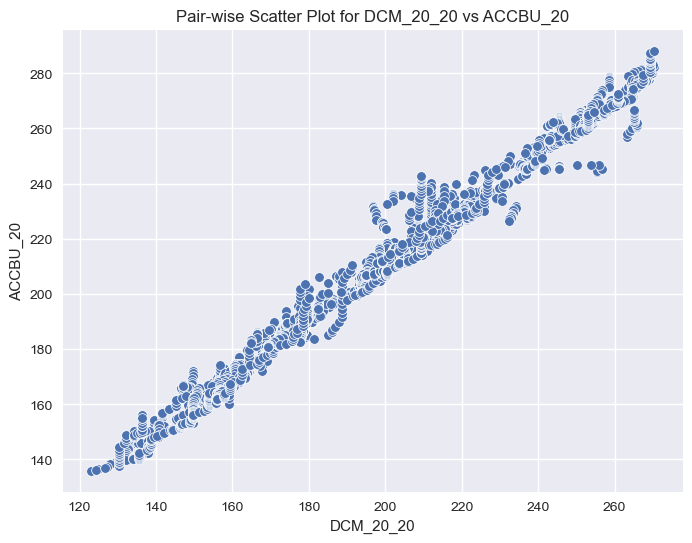

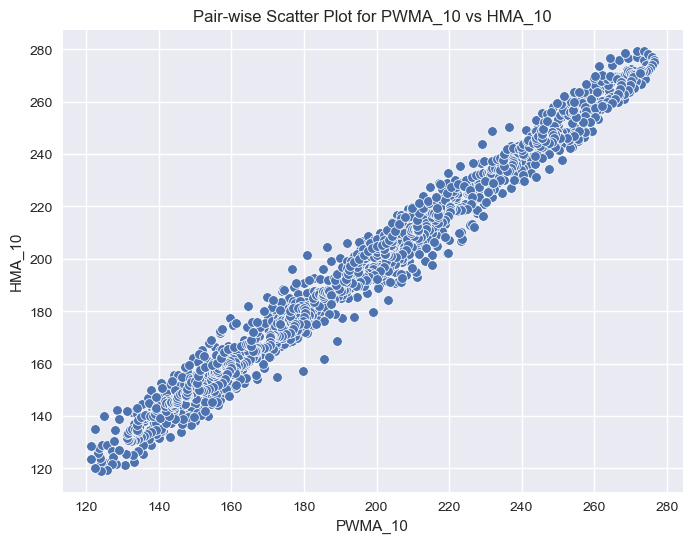

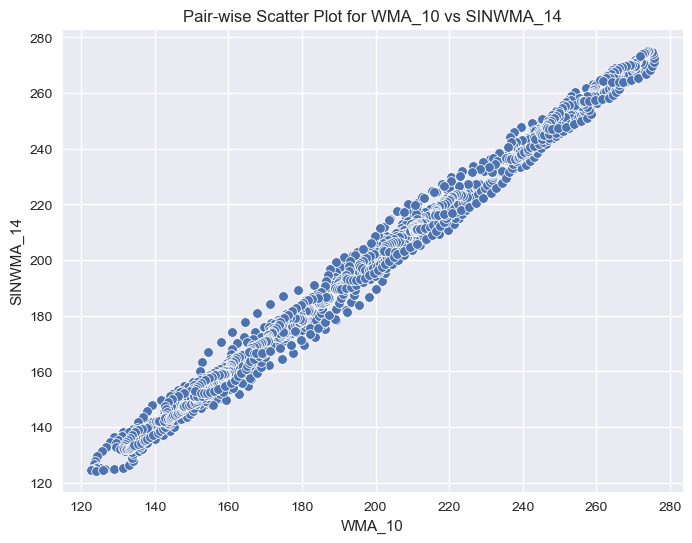

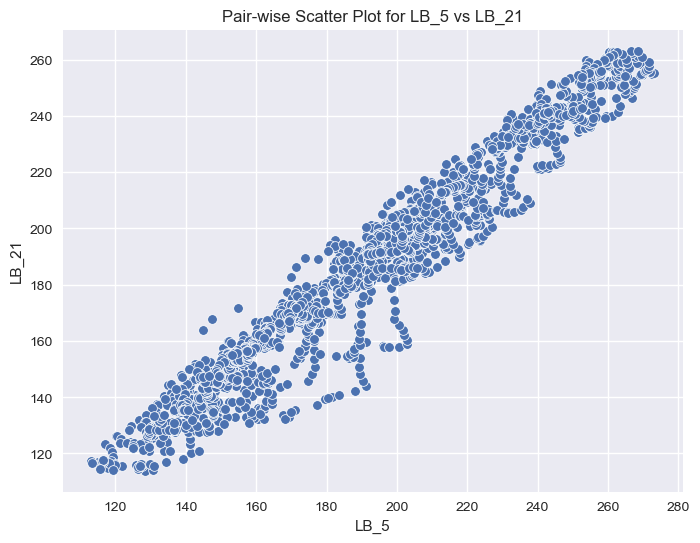

In [32]:
# Visualise relationship for a selection of feature pairs with high-correlation identified
column_pairs=[('Open', 'ABER_ZG_5_15'), ('ACCBU_20', 'Low'), ('DCM_20_20', 'ACCBU_20'),('PWMA_10', 'HMA_10'), ('WMA_10', 'SINWMA_14'), ('LB_5','LB_21')]
for pair in column_pairs:
    plt.figure(figsize=(8, 6))
    sns.scatterplot(data=data, x=pair[0], y=pair[1])
    plt.title(f'Pair-wise Scatter Plot for {pair[0]} vs {pair[1]}')
    plt.show()

### Pre-processing: Train-test Split

In [33]:
def train_dev_test_split(df, dev_share = 0.20, test_share = 0):
    
    '''
    This function splits the data into train, dev, test sets sequentially as training set, dev set, test set.

    '''
    # create raw values of the label column, drop last row (where label value = NaN) due to backward shift
    df['label'] = df['LOGRET'].shift(-1)
    df.dropna(axis='index', inplace=True)
    
    # split the dataset according to ratios specificied
    train_share = 1 - test_share - dev_share
    df_train = df.iloc[0:int(train_share * df.shape[0]), :]
    df_dev = df.iloc[int(train_share * df.shape[0]):int((train_share + dev_share) * df.shape[0]), :]
    df_test = df.iloc[int((train_share + dev_share) * df.shape[0]):, :]

    # remove "label" column from features df, create label df Y
    X_train = df_train.drop("label", axis=1)
    Y_train = df_train["label"]
    X_dev = df_dev.drop("label", axis=1)
    Y_dev = df_dev["label"]
    X_test = df_test.drop("label", axis=1)
    Y_test = df_test["label"] 
        
    return X_train, Y_train, X_dev, Y_dev, X_test, Y_test

# Splitting the datasets into training development and testing data.
X_train_df, Y_train_df_raw, X_dev_df, Y_dev_df_raw, X_test_df, Y_test_df_raw = train_dev_test_split(data, dev_share = 0.20, test_share = 0.20)

# # Output the train and test data size
print(f'''Train, dev and test data shape: 
        X_train: {X_train_df.shape}, Y_train: {Y_train_df_raw.shape},
        X_dev:   {X_dev_df.shape},   Y_dev:   {Y_dev_df_raw.shape},
        X_test:  {X_test_df.shape},  Y_test:  {Y_test_df_raw.shape}''')

Train, dev and test data shape: 
        X_train: (1431, 354), Y_train: (1431,),
        X_dev:   (477, 354),   Y_dev:   (477,),
        X_test:  (478, 354),  Y_test:  (478,)


### Pre-processing: Scaling

In [34]:
def custom_scale_data(X_train_df, X_dev_df, X_test_df):
    ''' 
    Custom scaler that:
    Scales numerical columns with Robust scaler
    Scales categorical columns  with Min-Max Scaler
    Leaves columns 'dsin' 'dcos' untouched
    '''
    
    # Identify binary columns and columns starting with "CDL_" 
    binary_columns = X_train_df.columns[X_train_df.nunique() == 2]
    cdl_columns = X_train_df.columns[X_train_df.columns.str.startswith("CDL_")]

    # Columns for MinMaxScaler
    minmax_columns = binary_columns.union(cdl_columns)

    # Columns not to touch
    inrange_columns = ['dsin','dcos']

    # Columns for RobustScaler
    robust_columns = X_train_df.columns.difference(minmax_columns).difference(inrange_columns)

    # Initialize scalers
    minmax_scaler = MinMaxScaler()
    robust_scaler = RobustScaler()

    # Fit and transform MinMaxScaler and RobustScaler on X_train_df 
    X_train_df_minmax = pd.DataFrame(minmax_scaler.fit_transform(X_train_df[minmax_columns]), columns=X_train_df[minmax_columns].columns)
    X_train_df_robust = pd.DataFrame(robust_scaler.fit_transform(X_train_df[robust_columns]), columns=X_train_df[robust_columns].columns)

    # Transform X_dev_df and X_test_df using the same scalers
    X_dev_df_minmax = pd.DataFrame(minmax_scaler.transform(X_dev_df[minmax_columns]), columns=X_dev_df[minmax_columns].columns)
    X_dev_df_robust = pd.DataFrame(robust_scaler.transform(X_dev_df[robust_columns]), columns=X_dev_df[robust_columns].columns)
    X_test_df_minmax = pd.DataFrame(minmax_scaler.transform(X_test_df[minmax_columns]), columns=X_test_df[minmax_columns].columns)
    X_test_df_robust = pd.DataFrame(robust_scaler.transform(X_test_df[robust_columns]), columns=X_test_df[robust_columns].columns)

    # Concatenate scaled features and weekday features into output dataframes
    X_train_df_scaled = pd.concat([X_train_df_minmax, X_train_df_robust, X_train_df[inrange_columns].reset_index(drop=True)], axis=1)
    X_dev_df_scaled = pd.concat([X_dev_df_minmax, X_dev_df_robust, X_dev_df[inrange_columns].reset_index(drop=True)], axis=1)
    X_test_df_scaled = pd.concat([X_test_df_minmax, X_test_df_robust, X_test_df[inrange_columns].reset_index(drop=True)], axis=1)

    return X_train_df_scaled, X_dev_df_scaled, X_test_df_scaled

# Custom scale feature sets 
X_train_df_scaled, X_dev_df_scaled, X_test_df_scaled = custom_scale_data(X_train_df, X_dev_df, X_test_df)

# view scaled feature sets
X_dev_df_scaled

,AMATe_LR_8_21_2,AMATe_SR_8_21_2,AOBV_LR_2,AOBV_SR_2,CDL_2CROWS,CDL_3INSIDE,CDL_3LINESTRIKE,CDL_3OUTSIDE,CDL_3WHITESOLDIERS,CDL_ADVANCEBLOCK,CDL_BELTHOLD,CDL_CLOSINGMARUBOZU,CDL_COUNTERATTACK,CDL_DARKCLOUDCOVER,CDL_DOJISTAR,...,WCP,WILLR_14,WMA_10,ZL_EMA_10,ZS_30,^FTSE_Close,close_Z_30_1,cpi_mom,high_Z_30_1,low_Z_30_1,open_Z_30_1,vol_yz_tesco_21,vol_yz_tesco_63,dsin,dcos
0,0.0,1.0,0.0,1.0,1.0,0.5,0.0,0.0,0.0,1.0,0.5,0.5,1.0,1.0,0.5,...,0.905825,-6.910964e-01,0.966229,0.924440,-0.133577,-0.520930,-0.133577,-1.50,-0.069161,-0.027994,-0.017488,2.210536,1.737918,-0.433884,-0.900969
1,0.0,1.0,0.0,1.0,1.0,0.5,0.0,0.5,0.0,1.0,0.5,0.5,1.0,1.0,0.5,...,0.957093,-2.629856e-01,0.958475,0.930078,0.003140,0.888074,0.003140,-1.50,-0.099914,0.086271,-0.080658,2.191638,1.729798,-0.974928,-0.222521
2,0.0,1.0,0.0,1.0,1.0,0.5,0.0,0.5,0.0,1.0,0.0,0.0,1.0,1.0,0.5,...,0.929828,-5.483914e-01,0.944716,0.913115,-0.184542,-0.378768,-0.184542,-1.50,-0.177832,0.037152,-0.076896,2.171478,1.723601,0.781831,0.623490
3,0.0,1.0,0.0,1.0,1.0,0.5,0.0,0.5,0.0,1.0,0.5,0.5,1.0,1.0,1.0,...,0.889002,-7.386654e-01,0.928144,0.896839,-0.385865,-0.630884,-0.385865,-1.50,-0.444018,-0.136731,-0.357986,-0.531158,1.723224,0.974928,-0.222521
4,0.0,1.0,0.0,1.0,1.0,0.5,0.0,0.5,0.0,1.0,0.5,0.5,1.0,1.0,0.5,...,0.854718,-8.189602e-01,0.905705,0.873933,-0.699627,-0.606606,-0.699627,-1.50,-0.547534,-0.295717,-0.585977,-0.515137,1.725578,0.433884,-0.900969
5,0.0,1.0,0.0,1.0,1.0,0.5,0.0,0.5,0.0,1.0,0.5,0.5,1.0,1.0,0.5,...,0.847100,-6.590680e-01,0.890163,0.850397,-0.605059,-0.977770,-0.605059,-1.50,-0.804006,-0.345321,-0.853207,-0.524374,1.724795,-0.433884,-0.900969
6,0.0,1.0,1.0,0.0,1.0,0.5,0.0,0.5,0.0,1.0,1.0,0.5,1.0,1.0,0.5,...,0.955554,-6.083189e-02,0.898397,0.879772,-0.135707,1.098208,-0.135707,-1.50,-0.196950,-0.154163,-0.558407,-0.503111,1.726830,-0.974928,-0.222521
7,1.0,0.0,1.0,0.0,1.0,0.5,0.0,0.5,0.0,1.0,0.5,0.5,1.0,1.0,0.5,...,0.908049,-4.258508e-01,0.894452,0.884627,-0.514579,-2.563756,-0.514579,-1.50,-0.490520,-0.181239,-0.429081,-0.488557,1.725451,0.781831,0.623490
8,0.0,1.0,0.0,1.0,1.0,0.5,0.0,0.5,0.0,1.0,0.5,0.5,1.0,1.0,0.5,...,0.908643,-3.548826e-01,0.894040,0.902641,-0.483354,0.969297,-0.483354,-1.50,-0.633720,-0.212966,-0.554422,-0.489873,0.741922,0.974928,-0.222521
9,0.0,1.0,1.0,0.0,1.0,0.5,0.0,0.5,0.0,1.0,0.5,0.5,1.0,1.0,0.5,...,0.913962,-1.994004e-01,0.895378,0.914297,-0.447202,-0.004301,-0.447202,-1.50,-0.572285,-0.179348,-0.457713,-0.486634,0.738650,0.433884,-0.900969


### Feature Selection: Multicolinearity (Filter method)

In [35]:
# Get list of numerical column list and categorical column list
numerical_column_list = numerical_data.columns.to_list()
categorical_column_list = categorical_data.columns.to_list()

In [36]:
# Function to get high-correlation pairs (>0.9)
def get_high_corr_pairs(df):
    ''' 
    Takes in a dataframe as argument, calculates all correlation matrix, and return a tuple of
    Sorted_features_list: a list of all features present in high-correlation pairs, in descending order of their frequency of appearance
    feature_counts_list: a dictionary with each feature in the sorted_feature_list as unique key, and their frequency of appearance 
                         in high-correlated pairs as values.
    high_corr_df: a dataframe storing each pair or high-correlation as a row.
    '''
    # Compute correlation matrix
    correlation_matrix = df.corr()

    # Create empty dataframe to store all pairs
    high_corr_df = pd.DataFrame(columns=['f1', 'f2', 'rho'])

    # Get all pairs of features with a correlation coefficient > 0.9
    #   - Iterate through the upper triangular part of the correlation matrix
    for i in range(len(correlation_matrix.columns)):
        for j in range(i + 1, len(correlation_matrix.columns)):
            f1 = correlation_matrix.columns[i]
            f2 = correlation_matrix.columns[j]
            rho = correlation_matrix.iloc[i, j]
            # get high-correlation pairs and append them to high_corr_df dataframe
            if abs(rho) > 0.9:
                high_corr_df = high_corr_df.append({'f1': f1, 'f2': f2, 'rho': rho}, ignore_index=True)
    
    # Concatenate values from "f1" and "f2" columns and calculate frequency
    feature_counts_dict = high_corr_df[['f1', 'f2']].stack().value_counts().to_dict()
    
    # Get all frequency of each Feature, rank descending
    sorted_features_list = sorted(feature_counts_dict, key=feature_counts_dict.get, reverse=True)

    return sorted_features_list, feature_counts_dict, high_corr_df

# Initial high-corr feature pairs information
sorted_features_list_init = get_high_corr_pairs(X_train_df_scaled[numerical_column_list])[0]
feature_counts_dict_init = get_high_corr_pairs(X_train_df_scaled[numerical_column_list])[1]
high_corr_df_init = get_high_corr_pairs(X_train_df_scaled[numerical_column_list])[2]

# inspect high-corr feature pairs
high_corr_df_init

,f1,f2,rho
0,Open,High,0.996928
1,Open,Low,0.997241
2,Open,Close,0.995802
3,Open,ABER_ZG_5_15,0.994482
4,Open,ABER_SG_5_15,0.994004
...,...,...,...
3020,CUM_LOGRET_21,PCHG_21,0.997631
3021,VMA_SCALED_21,VMA_SCALED_63,0.933151
3022,UB_21,LB_21,0.921389
3023,CUM_LOGRET_63,PCHG_63,0.994169


In [37]:
print(f''' Number of features with high correlations: {len(feature_counts_dict_init)}
Features and the number of high-corr pairs they are associated with: 
{feature_counts_dict_init}''')

 Number of features with high correlations: 191
Features and the number of high-corr pairs they are associated with: 
{'QTL_30_0.5': 76, 'VIDYA_14': 76, 'IKS_26': 76, 'MEDIAN_30': 76, 'SUPERT_7_3.0': 75, 'CKSPs_10_3_20': 75, 'Open': 74, 'SSF_10_2': 74, 'SMA_10': 74, 'SINWMA_14': 74, 'RMA_10': 74, 'PWMA_10': 74, 'T3_10_0.7': 74, 'OHLC4': 74, 'MIDPRICE_2': 74, 'MIDPOINT_2': 74, 'MCGD_10': 74, 'LR_14': 74, 'KCUe_20_2': 74, 'SWMA_10': 74, 'TRIMA_10': 74, 'TEMA_10': 74, 'KCLe_20_2': 74, 'High': 74, 'LB_21': 74, 'UB_21': 74, 'LB_5': 74, 'UB_5': 74, 'LB_4': 74, 'UB_4': 74, 'LB_3': 74, 'UB_3': 74, 'LB_2': 74, 'UB_2': 74, 'ZL_EMA_10': 74, 'WMA_10': 74, 'VWMA_10': 74, 'VWAP_D': 74, 'KCBe_20_2': 74, 'WCP': 74, 'KAMA_10_2_30': 74, 'DCU_20_20': 74, 'ABER_XG_5_15': 74, 'ACCBL_20': 74, 'ACCBM_20': 74, 'ACCBU_20': 74, 'ALMA_10_6.0_0.85': 74, 'BBL_5_2.0': 74, 'BBM_5_2.0': 74, 'BBU_5_2.0': 74, 'Close': 74, 'Low': 74, 'LDECAY_5': 74, 'DEMA_10': 74, 'DCL_20_20': 74, 'DCM_20_20': 74, 'EMA_10': 74, 'ABER_ZG

In [38]:


# Copy variables for reduction in loop
high_corr_df_reduced = high_corr_df_init.copy()
sorted_features_list_reduced = sorted_features_list_init.copy()
feature_counts_dict_reduced = feature_counts_dict_init.copy()

# Get current number of pairs with high correlation 
num_rows = high_corr_df_reduced.shape[0]

# Create list of all features removed in loop
features_removed = []

# LOOP: To interatively remove features that have the most frequent presence in the high-correlation pairs
while num_rows > 0:
    # Get next feature to remove
    feature = sorted_features_list_reduced[0]
    
    # Add feature to removed list
    features_removed.append(feature)

    # Remaining features from original feature set
    features_after_each_removal = [feature for feature in X_train_df_scaled.columns.tolist() if feature not in features_removed]

    # Get new correlation pairs after feature removal
    new_corr = get_high_corr_pairs(X_train_df_scaled[features_after_each_removal])
    sorted_features_list_reduced = new_corr[0]
    feature_counts_dict_reduced = new_corr[1]
    high_corr_df_reduced = new_corr[2]
    
    # Count remaining rows in high correlation feature pairs
    num_rows = high_corr_df_reduced.shape[0]

    # Print progress
    print(f"feature removed: {len(features_removed)}. {feature}  | pairs remaining: {num_rows}")

# Get final list of features to keep after removing high correlations
features_filtered_by_corr = [feature for feature in X_train_df_scaled.columns.tolist() if feature not in features_removed]


feature removed: 1. QTL_30_0.5  | pairs remaining: 2958
feature removed: 2. MEDIAN_30  | pairs remaining: 2883
feature removed: 3. VIDYA_14  | pairs remaining: 2809
feature removed: 4. IKS_26  | pairs remaining: 2736
feature removed: 5. CKSPs_10_3_20  | pairs remaining: 2665
feature removed: 6. SUPERT_7_3.0  | pairs remaining: 2595
feature removed: 7. LB_3  | pairs remaining: 2527
feature removed: 8. LB_21  | pairs remaining: 2460
feature removed: 9. JMA_7_0  | pairs remaining: 2394
feature removed: 10. ITS_9  | pairs remaining: 2329
feature removed: 11. KAMA_10_2_30  | pairs remaining: 2265
feature removed: 12. KCBe_20_2  | pairs remaining: 2202
feature removed: 13. LDECAY_5  | pairs remaining: 2140
feature removed: 14. LB_5  | pairs remaining: 2079
feature removed: 15. HA_high  | pairs remaining: 2019
feature removed: 16. HA_close  | pairs remaining: 1960
feature removed: 17. Open  | pairs remaining: 1902
feature removed: 18. PWMA_10  | pairs remaining: 1845
feature removed: 19. DCU_

In [39]:
# Get new dataframe after filtering for high-correlaitons 
X_train_df_scaled_corr_filtered = X_train_df_scaled[features_filtered_by_corr]
X_dev_df_scaled_corr_filtered = X_dev_df_scaled[features_filtered_by_corr]
X_test_df_scaled_corr_filtered = X_test_df_scaled[features_filtered_by_corr]

# View filtered feature set
X_train_df_scaled_corr_filtered

,AMATe_SR_8_21_2,AOBV_SR_2,CDL_2CROWS,CDL_3INSIDE,CDL_3LINESTRIKE,CDL_3OUTSIDE,CDL_3WHITESOLDIERS,CDL_ADVANCEBLOCK,CDL_BELTHOLD,CDL_CLOSINGMARUBOZU,CDL_COUNTERATTACK,CDL_DARKCLOUDCOVER,CDL_DOJISTAR,CDL_ENGULFING,CDL_EVENINGDOJISTAR,...,VHF_28,VMA_SCALED_2,VMA_SCALED_3,VMA_SCALED_5,VMA_SCALED_63,VTXM_14,VTXP_14,WILLR_14,^FTSE_Close,close_Z_30_1,cpi_mom,vol_yz_tesco_21,vol_yz_tesco_63,dsin,dcos
0,0.0,1.0,1.0,0.5,0.0,0.5,0.0,1.0,0.5,0.5,1.0,1.0,0.5,0.5,1.0,...,0.613907,-0.149528,-0.122374,-0.369814,-0.351452,-0.277996,0.408973,0.076734,0.259824,0.588722,-0.25,0.206500,0.018316,0.433884,-0.900969
1,0.0,1.0,1.0,0.5,0.0,0.5,0.0,1.0,0.5,0.5,1.0,1.0,0.5,0.5,1.0,...,0.713555,-0.312005,-0.366242,-0.552425,-0.604604,-0.330060,0.727986,0.059680,-0.053300,0.539783,-0.25,0.197076,-0.004698,-0.433884,-0.900969
2,0.0,1.0,1.0,0.5,0.0,0.5,0.0,1.0,0.5,0.5,1.0,1.0,0.5,0.5,1.0,...,0.696304,-0.468028,-0.588667,-0.739535,-0.901256,-0.473537,0.814960,0.092805,-0.124135,0.530497,-0.25,0.193892,-0.007495,-0.974928,-0.222521
3,0.0,1.0,1.0,0.5,0.0,0.5,0.0,1.0,0.0,0.5,1.0,1.0,0.5,0.0,1.0,...,0.366477,0.033300,-0.204700,-0.542713,-0.900993,-0.796591,0.745440,0.028021,0.421903,0.448404,-0.25,0.201778,-0.004242,0.974928,-0.222521
4,1.0,1.0,1.0,0.5,0.0,0.0,0.0,1.0,0.5,0.5,1.0,1.0,0.5,0.5,1.0,...,0.570205,0.769880,0.877179,0.548750,-0.429134,-0.641540,0.704017,-0.045053,0.054196,0.362021,-0.25,0.215688,-0.005480,0.433884,-0.900969
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1426,1.0,1.0,1.0,0.5,0.0,0.5,0.0,1.0,0.5,0.5,1.0,1.0,0.5,0.5,1.0,...,0.550486,-0.013490,-0.063345,0.321057,0.292971,-0.082615,0.064432,0.687365,0.289411,0.326952,-1.50,2.755727,1.909124,-0.433884,-0.900969
1427,1.0,1.0,1.0,0.5,0.0,0.5,0.0,1.0,0.5,0.5,1.0,1.0,0.5,0.0,1.0,...,0.515266,0.443520,0.477424,0.621764,0.821006,-0.138207,2.460800,-0.807432,-0.194257,0.148216,-1.50,2.586218,1.900668,-0.974928,-0.222521
1428,1.0,1.0,1.0,0.5,0.0,0.0,0.0,1.0,0.5,0.5,1.0,1.0,0.5,0.5,1.0,...,0.790326,-1.020664,-0.763239,-0.720040,-0.349816,-0.101190,-0.305051,-0.661451,0.382888,0.097083,-1.50,2.591792,1.858338,0.781831,0.623490
1429,1.0,1.0,1.0,0.5,0.0,0.5,0.0,1.0,0.5,0.5,1.0,1.0,0.5,0.5,1.0,...,0.815707,-0.042479,-0.601733,-0.628290,-0.415867,0.142316,-0.201009,-0.422076,0.022318,0.144620,-1.50,2.583815,1.752231,0.974928,-0.222521


### Feature Selection: Dimensionality Reduction using SOM and K-means clustering


#### (1) Get Elbow Plot for number of K-means clusters to determine optimal number of clusters

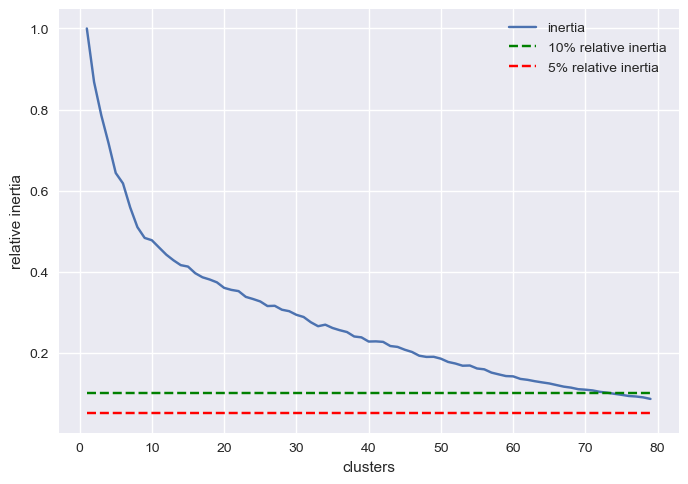

In [40]:
# transpose dataset for KMeans clustering
X_train_kmeans = X_train_df_scaled_corr_filtered.T

# set range of clusters for elbow plot and run trials to get inertia value
n_clusters = range(1, 80)
inertia = []
for n in n_clusters:
    kmeans = KMeans(n_clusters=n, random_state=RANDOM_SEED)
    kmeans.fit(X_train_kmeans)
    inertia.append(kmeans.inertia_)

# create elbow plot of inertia 
plt.plot(n_clusters, np.divide(inertia,inertia[0]))
plt.hlines(0.1, n_clusters[0], n_clusters[-1], 'g', linestyles='dashed')
plt.hlines(0.05, n_clusters[0], n_clusters[-1], 'r', linestyles='dashed')
plt.xlabel('clusters')
plt.ylabel('relative inertia')
plt.legend(['inertia', '10% relative inertia', '5% relative inertia']);

#### (2) Reduce dimensions using combined result of K-means and SOM

 [ 20000 / 20000 ] 100% - 0:00:00 left 
 quantization error: 12.675531656805957
 topographic error: 0.19597989949748743
['AD', 'ADX_14', 'AROOND_14', 'ATRr_14', 'BBB_5_2.0', 'BBP_5_2.0', 'CDL_GAPSIDESIDEWHITE', 'CDL_INNECK', 'CDL_RICKSHAWMAN', 'CDL_UPSIDEGAP2CROWS', 'CFO_9', 'CHOP_14_1_100', 'CKSPl_10_3_20', 'CMF_20', 'CTI_12', 'DMN_14', 'DMP_14', 'EFI_13', 'ER_10', 'FISHERTs_9_1', 'GAP_1', 'GAP_2', 'GAP_21', 'GAP_3', 'GAP_4', 'GAP_63', 'GBPUSD=X_Close', 'HC_1', 'HC_2', 'HML', 'INC_1', 'J_9_3', 'KURT_30', 'KVOs_34_55_13', 'LOGRET_LAG_1', 'LOGRET_LAG_2', 'LOGRET_LAG_21', 'LOGRET_LAG_3', 'LOGRET_LAG_4', 'LOGRET_LAG_5', 'LOGRET_LAG_63', 'MACDh_12_26_9', 'MASSI_9_25', 'MFI_14', 'Mkt-RF', 'NATR_14', 'OC_1', 'OC_2', 'OC_21', 'OC_4', 'PCHG_2', 'PCHG_4', 'PCHG_63', 'PDIST', 'PGO_14', 'PPOh_12_26_9', 'PSARaf_0.02_0.2', 'PSL_12', 'PVOL', 'PVO_12_26_9', 'PVOh_12_26_9', 'PVR', 'PVT', 'QS_10', 'RVGIs_14_4', 'RVI_14', 'SMB', 'SMIo_5_20_5', 'SMIs_5_20_5', 'SQZ_OFF', 'STCstoch_10_12_26_0.5', 'STDEV_30

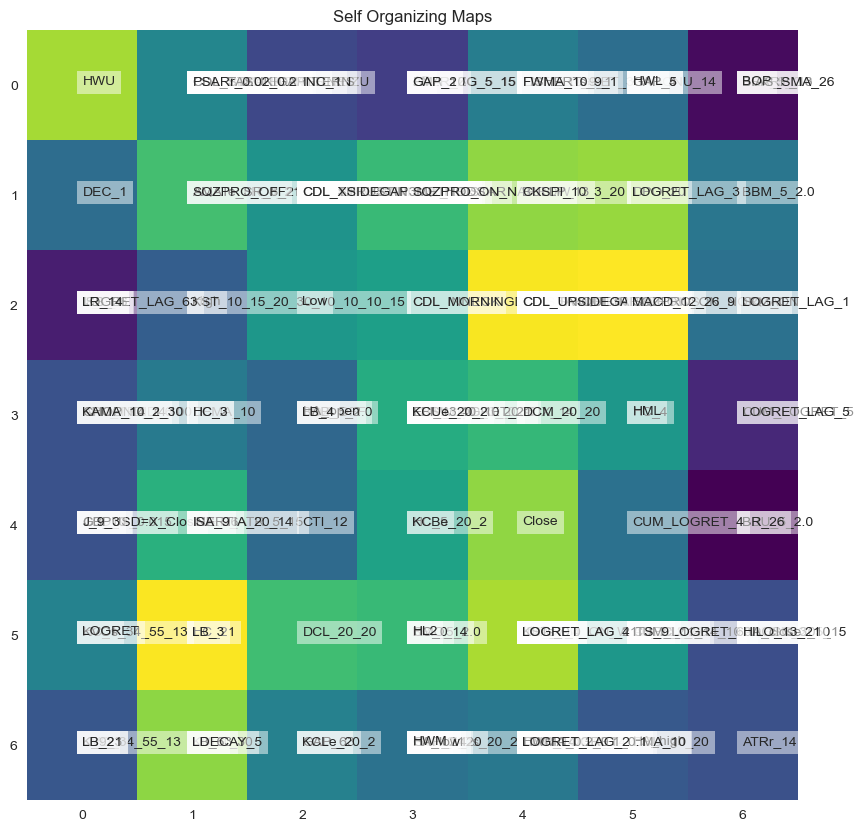

In [41]:
# Set gloabl parameters
RANDOM_SEED = 90
clusters = 70
map_size = 7

###################################################################################################################
###################################### DIMENSIONALITY REDUCTION FUNCTION ##########################################
###################################################################################################################

# Initialise list of reduced features
kmeans_som_reduced_candidate_groups = []

# Declare function for dimensionality reduction based on K-means and SOM results
def drop_features(kmeans_feature_group_orig, som_feature_group_orig, base="kmeans"):
    '''
    Drops all features that are classified in the same cluster in both SOM and K-means, 
    keeping only the first one appearing in each group.
    '''
    
    # Create copies of feature groups
    kmeans_feature_group = [group.copy() for group in kmeans_feature_group_orig]
    som_feature_group = [group.copy() for group in som_feature_group_orig]
    
    # Create copies of feature groups for removing first elements
    kmeans_feature_group_first_removed = [group.copy() for group in kmeans_feature_group]
    som_feature_group_first_removed = [group.copy() for group in som_feature_group]
    
    # Create list storing number of features after each iteration, 
    # Populate first element with initial number of features
    num_feature_records = []
    num_feature_records.append(len(features_filtered_by_corr))

    # Choose reference method
    if base=="kmeans":
      base_set = kmeans_feature_group_first_removed
      ref_set = som_feature_group_first_removed

    if base=="som":
      base_set = som_feature_group_first_removed
      ref_set = kmeans_feature_group_first_removed
      
    # Create run flag
    run_flag = True

    # Eliminate features that are classified into same cluster/cell for both SOM and Kmeans
    while run_flag:   
        # Iterate through base_set
        for top_base_index, base_sublist in enumerate(base_set):
            # If sublist contains <2 elements, pass
            if len(base_sublist) < 2:
                continue

            # Identify the sublist in ref_set that contains the first element
            for top_ref_index, ref_sublist in enumerate(ref_set):

                if base_sublist[0] in ref_sublist:

                    # Check every element at index 1+ in kmeans_sublist, 
                    # If it exists in the the SAME ref_sublist
                    for low_base_index, base_feature in enumerate(base_sublist[1:]):
                        if base_feature in ref_sublist:

                            # mark element to drop in kmeans_feature_group
                            base_set[top_base_index][low_base_index+1] += "_DROP"

                            # index of feature in som_sublist
                            low_ref_index = ref_sublist.index(base_feature)

                            # mark element to drop in som_feature_group
                            ref_set[top_ref_index][low_ref_index] += "DROP"

        filtered_base_set = []
        filtered_ref_set = []

        # Iterate through kmeans_feature_group_first_removed, 
        # for those flagged with "_DROP", remove from kmeans_feature_group 
        for top_base_index, base_sublist in enumerate(base_set):
            for feature in base_sublist:
                if feature.endswith("_DROP"):
                    if base == "kmeans":
                        kmeans_feature_group[top_base_index].remove(feature[:-5])
                    if base == "som":
                        som_feature_group[top_base_index].remove(feature[:-5])
            filtered_base_sublist = [feature for feature in base_sublist if not feature.endswith("_DROP")]
            filtered_base_set.append(filtered_base_sublist)

        # Iterate through som_feature_group_first_removed, 
        # Remove those flagged with "DROP", remove from som_feature_group 
        for top_ref_index, ref_sublist in enumerate(som_feature_group_first_removed):
            filtered_ref_sublist = [feature for feature in ref_sublist if not feature.endswith("_DROP")]
            filtered_ref_set.append(filtered_ref_sublist)

        # Update the feature groups with new filtered features
        base_set = filtered_base_set
        base_set = [sublist[1:] for sublist in base_set]

        # The total number of elements across all sublists after filtering
        num_features = 0
        if base == "kmeans":
          for base_sublist in kmeans_feature_group:
              num_features += len(base_sublist)
              
        if base == "som":
          for base_sublist in som_feature_group:
              num_features += len(base_sublist)

        # If no more reductions are made - all drops are complete
        num_feature_records.append(num_features)
        if num_feature_records[-1] == num_feature_records[-2]:
            run_flag = False

    # Get final features list
    reduced_dim_features = []
    if base == "kmeans":
      for sublist in kmeans_feature_group:
          for feature in sublist:
              reduced_dim_features.append(feature)

    if base == "som":
      for sublist in som_feature_group:
          for feature in sublist:
              reduced_dim_features.append(feature)
            
    return reduced_dim_features

##############################################################################################################
################################################ SOM MODEL ###################################################
##############################################################################################################

# Create dataset for training SOM
X_train_som = X_train_df_scaled_corr_filtered.T.to_numpy()

# Initiate empty list for all SOM results for all seed interations
som_results_all = []

# Initiate and train SOM
som = MiniSom(map_size, map_size, X_train_som.shape[1], learning_rate=0.4, sigma=1, random_seed=RANDOM_SEED)
som.random_weights_init(X_train_som)
som.train_batch(X_train_som, 20000, verbose=True)

# Print results
print(f" topographic error: {som.topographic_error(X_train_som)}")

# Cisualise SOM results
plt.figure(figsize=(20, 10))
for ix in range(len(X_train_som)):
    winner = som.winner(X_train_som[ix])
    plt.text(winner[0], winner[1], 
             X_train_df_scaled.columns[ix],
             bbox=dict(facecolor='white', alpha=0.5, lw=0))
plt.imshow(som.distance_map(), cmap='viridis')
plt.grid(False)
plt.title('Self Organizing Maps');

# Create an empty DataFrame
som_results_df = pd.DataFrame(columns=["index_0", "index_1", "feature"])

# Write the corresponding features and cells into dataframe
for ix in range(len(X_train_som)):
    winner = som.winner(X_train_som[ix])
    som_results_df.loc[len(som_results_df)] = {"index_0": winner[0],
                                               "index_1": winner[1],
                                               "feature": X_train_df_scaled_corr_filtered.T.index[ix]}
    
# Group the dataframe by cell in SOM
som_results_df_grouped = som_results_df.groupby(["index_0", "index_1"])

################################# SAVE SOM RESULTS ####################################
# Create a list of lists of feature names for each group
som_feature_group_orig = []

# Iterate through groups in SOM result
for (index_0, index_1), group_data in som_results_df_grouped:
    # Get unique feature names in the "feature" column for each group
    som_unique_feature_names = group_data['feature'].unique().tolist()
    
    # Append the list of unique feature names to the result list
    som_feature_group_orig.append(som_unique_feature_names)
    
# Append iteration result to all results list
som_results_all.append(som_feature_group_orig)

##############################################################################################################
############################################## K-MEANS MODEL #################################################
##############################################################################################################


# transpose dataset for KMeans clustering
X_train_kmeans = X_train_df_scaled_corr_filtered.T

# Fit the Kmeans model
kmeans_model = KMeans(n_clusters=clusters, random_state=RANDOM_SEED)

# fit Kmeans model
kmeans_model.fit(X_train_kmeans)

# Assign labels  
labels = kmeans_model.predict(X_train_kmeans)                    # column 0: labels

# Cet cluster centers
centroids = kmeans_model.cluster_centers_
#print(f"Centroids: {centroids}, shape: {centroids.shape}")       # column 2: centroids (needs matching)

# Create new dataframe for output and training data
data_points = X_train_kmeans.to_numpy()
#print(f"Data points: {data_points}, shape: {data_points.shape}") # column 1: data points 

# Create dataframe for feature name, labels, and datapoints
kmeans_df = pd.DataFrame({
    'feature': features_filtered_by_corr,
    'cluster': labels,
    'Data': data_points.tolist()
})

# Create new column for centroid vector
kmeans_df['Centroids'] = kmeans_df['cluster'].apply(lambda cluster: centroids.tolist()[cluster])

# Convert values in the Data and Centroids columns into numpy vectors
kmeans_df['Data'] = kmeans_df['Data'].apply(lambda x: np.array(x))
kmeans_df['Centroids'] = kmeans_df['Centroids'].apply(lambda x: np.array(x))

# Get distance to cluster centers
kmeans_df["distance"] = np.linalg.norm(np.vstack(kmeans_df['Data']) - np.vstack(kmeans_df['Centroids']), axis=1)

# Create results for output
kmeans_results_df = kmeans_df.sort_values(by=['cluster','distance'], 
                                          ascending = [True, True], 
                                          axis = 0)[['cluster','feature', 'distance']]

############################################## SAVE K-MEANS RESULTS #############################################

# Create empty list for feature groups clustered in K-means algorithm
kmeans_feature_group_orig = []

# Group the dataframe by cell in Kmeans
kmeans_results_df_grouped = kmeans_results_df.groupby(["cluster"])

# Iterate through groups in K-means result
for (cluster), group_data in kmeans_results_df_grouped:
    # Get unique feature names in the "feature" column for each group
    kmeans_unique_feature_names = group_data['feature'].unique().tolist()
    # Append the list of unique feature names to the result list
    kmeans_feature_group_orig.append(kmeans_unique_feature_names)


##################################################################################################################
############################################### REDUCE DIMENSION #################################################
##################################################################################################################

for som_iteration_result in som_results_all:
    # Get list of filtered features
    reduced_dim_features = drop_features(kmeans_feature_group_orig, som_iteration_result, base="kmeans")

    # Append candidate group to all groups list
    kmeans_som_reduced_candidate_groups.append(reduced_dim_features)
    
    # View selected features
    print(sorted(reduced_dim_features))
    print()
    print(f"number selected: {len(reduced_dim_features)}")
    print()

In [42]:
# visualise K-Means clustering results and output to csv
kmeans_results_df.to_csv("kmeans_results.csv")
kmeans_results_df

,cluster,feature,distance
106,0,J_9_3,7.351783e+00
191,0,WILLR_14,9.368179e+00
76,0,CCI_14_0.015,1.037229e+01
86,0,EBSW_40_10,1.070161e+01
168,0,STOCHRSIk_14_14_3_3,1.167086e+01
71,0,BBP_5_2.0,1.462504e+01
158,0,SMIo_5_20_5,1.499664e+01
176,0,UO_7_14_28,1.710237e+01
85,0,DPO_20,2.577468e+01
51,1,CDL_UPSIDEGAP2CROWS,2.041658e+00


#### (3) Slice feature set with reduced dimensionality features

In [43]:
# Get list of features selected
kmeans_som_features = kmeans_som_reduced_candidate_groups[0]

# Filtered features
X_train_df_scaled_kmeans_som = X_train_df_scaled[kmeans_som_features]
X_dev_df_scaled_kmeans_som = X_dev_df_scaled[kmeans_som_features]
X_test_df_scaled_kmeans_som = X_test_df_scaled[kmeans_som_features]

# View 
X_train_df_scaled_kmeans_som

,J_9_3,WILLR_14,BBP_5_2.0,SMIo_5_20_5,CDL_UPSIDEGAP2CROWS,SQZ_OFF,VCHG_2,CDL_GAPSIDESIDEWHITE,INC_1,THERMOs_20_2_0.5,SUPERTd_7_3.0,CDL_INNECK,CDL_RICKSHAWMAN,AROOND_14,PVR,...,VCHG_1,DMP_14,VCHG_4,ADX_14,^FTSE_Close,VTXM_14,dsin,HC_1,BBB_5_2.0,HML,ER_10,AD,CHOP_14_1_100,OC_4,MASSI_9_25
0,-0.031455,0.076734,-0.390621,-0.041050,1.0,1.0,-0.170862,0.5,0.0,1.0,1.0,0.0,0.0,-0.2,0.5,...,-0.139776,2.283319,-0.455956,0.462634,0.259824,-0.277996,0.433884,0.745603,0.177006,0.043478,0.482508,1.509226,-0.473147,0.232894,1.102748
1,-0.247253,0.059680,-0.485234,-0.291863,1.0,1.0,-0.415944,0.5,0.0,1.0,1.0,0.0,1.0,-0.3,0.5,...,-0.279575,2.001703,-0.707866,0.537940,-0.053300,-0.330060,-0.433884,-0.561931,0.104483,-0.282609,-0.049717,1.512624,-0.667894,-0.472784,1.025024
2,-0.327906,0.092805,-0.246218,-0.323785,1.0,1.0,-0.609040,0.5,1.0,0.0,1.0,0.0,0.0,-0.4,-0.5,...,-0.403336,1.838463,-0.681863,0.613343,-0.124135,-0.473537,-0.974928,-0.465055,0.006146,1.847826,-0.135956,1.515244,-0.840616,-0.422142,0.912759
3,-0.404694,0.028021,-0.520160,-0.424765,1.0,1.0,-0.399661,0.5,0.0,0.0,1.0,0.0,0.0,-0.5,0.5,...,0.032720,1.646422,-0.678492,0.686707,0.421903,-0.796591,0.974928,-0.317244,-0.730399,0.043478,0.071471,1.503808,-0.798749,-0.389712,0.686135
4,-0.555837,-0.045053,-0.826751,-0.564554,1.0,1.0,0.806589,0.5,0.0,1.0,1.0,0.0,0.0,-0.6,0.0,...,0.952643,1.410299,-0.099458,0.708174,0.054196,-0.641540,0.433884,-0.332444,-0.762788,0.695652,-0.273531,1.499302,-0.820903,-0.409927,0.440891
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1426,-0.382224,0.687365,-0.081214,-0.603995,1.0,0.0,-0.181734,0.5,1.0,1.0,1.0,0.0,0.0,-0.6,-0.5,...,-0.013083,1.163784,0.837998,-0.487529,0.289411,-0.082615,-0.433884,0.261593,-0.514799,-0.956522,-0.797456,-1.122057,-1.402486,0.181147,0.486153
1427,-0.797448,-0.807432,-0.721870,-1.006122,1.0,0.0,0.345706,0.5,0.0,1.0,1.0,0.0,0.0,-0.7,0.0,...,0.492244,0.962135,0.794312,-0.518415,-0.194257,-0.138207,-0.974928,0.224333,-0.291017,-0.260870,-0.109200,-1.173370,1.165572,-0.362249,0.341962
1428,-0.872146,-0.661451,-0.562555,-1.123641,1.0,0.0,-0.507586,0.5,0.0,0.0,1.0,0.0,0.0,0.7,0.5,...,-0.774613,0.774889,-0.601465,-0.530237,0.382888,-0.101190,0.781831,0.780133,-0.154240,-0.130435,0.716448,-1.193657,0.906772,-0.530243,0.315068
1429,-0.710560,-0.422076,-0.098798,-0.856496,1.0,0.0,-0.765551,0.5,1.0,1.0,1.0,0.0,0.0,0.6,-0.5,...,-0.040872,0.601019,-0.558412,-0.541215,0.022318,0.142316,0.974928,-0.767784,-0.422076,-0.500000,0.211338,-1.175907,0.870949,-0.317070,0.272505


#### (4) Output new datasets to CSV: Dataset after removing high correlation + dataset after reducing dimensionality

In [44]:
# Output dimensionally reduced data to csv

# Raw - all features 
X_train_df_scaled.to_csv("data/X_train_df_scaled.csv")
X_dev_df_scaled.to_csv("data/X_dev_df_scaled.csv")
X_test_df_scaled.to_csv("data/X_test_df_scaled.csv")

# Filtered - after removing high correlation 
X_train_df_scaled_corr_filtered.to_csv("data/X_train_df_scaled_corr_filtered.csv")
X_dev_df_scaled_corr_filtered.to_csv("data/X_dev_df_scaled_corr_filtered.csv")
X_test_df_scaled_corr_filtered.to_csv("data/X_test_df_scaled_corr_filtered.csv")

# Dimensionally reduced - using SOM and K-means for dim reduction
X_train_df_scaled_kmeans_som.to_csv("data/X_train_df_scaled_kmeans_som.csv")
X_dev_df_scaled_kmeans_som.to_csv("data/X_dev_df_scaled_kmeans_som.csv")
X_test_df_scaled_kmeans_som.to_csv("data/X_test_df_scaled_kmeans_som.csv")

# Raw target values
Y_train_df_raw.to_csv("data/Y_train_df_raw.csv")
Y_dev_df_raw.to_csv("data/Y_dev_df_raw.csv")
Y_test_df_raw.to_csv("data/Y_test_df_raw.csv")


In [49]:
# Output raw prices for backtesting
X_test_df.to_csv("data/X_test_df_raw.csv")
Y_test_df_raw.to_csv("data/Y_test_df_raw.csv")